**Data Preprocessing**

Importing Libraries


In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
import math
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
import lightgbm as lgb
import optuna

Loading the dataset


In [63]:
df = pd.read_csv('forestfires.csv') #loads the dataset for Portugal wildfires
print(df.head(), '\n') #displays the first five rows of the dataset
print(df.info(), '\n') #displays summary information and the column names and datatypes of the dataset
print(df.describe()) #displays the statistical summary of the numerical columns of the dataset

   X  Y month  day  FFMC   DMC     DC  ISI  temp  RH  wind  rain  area
0  7  5   mar  fri  86.2  26.2   94.3  5.1   8.2  51   6.7   0.0   0.0
1  7  4   oct  tue  90.6  35.4  669.1  6.7  18.0  33   0.9   0.0   0.0
2  7  4   oct  sat  90.6  43.7  686.9  6.7  14.6  33   1.3   0.0   0.0
3  8  6   mar  fri  91.7  33.3   77.5  9.0   8.3  97   4.0   0.2   0.0
4  8  6   mar  sun  89.3  51.3  102.2  9.6  11.4  99   1.8   0.0   0.0 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    int64  
 10  wind    517 non-nu

Handling of missing values and duplicate instances 

In [64]:
#checks for duplicates and missing values before cleaning 
print("duplicates:", df.duplicated().sum())  #checks for duplicates  
print("missing values:", df.isnull().sum().sum()) #checks for missing values

#cleans the dataset for both duplicates and missing values 
df.drop_duplicates(inplace=True) #removes duplicates 
df.dropna(inplace=True) #removes any missing values 

# confirms that duplicates and missing values have been removed
print("duplicates:", df.duplicated().sum())  #checks for duplicates  
print("missing values:", df.isnull().sum().sum()) #checks for missing values

duplicates: 4
missing values: 0
duplicates: 0
missing values: 0


**Data Visualisation and Analysis**

Monthly fire occurence visualisation and analysis


Total Fires Recorded per Month:
        Total Fires Recorded
month                      
jan                       2
feb                      20
mar                      53
apr                       9
may                       2
jun                      16
jul                      32
aug                     182
sep                     172
oct                      15
nov                       1
dec                       9


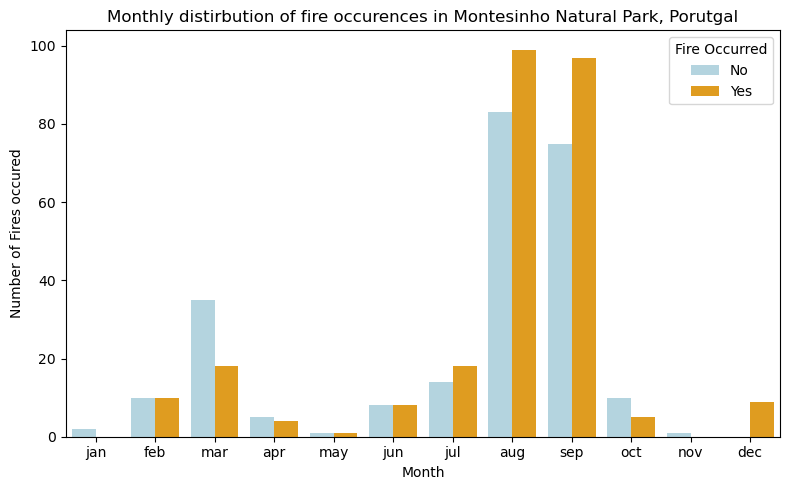

In [65]:
df['fire_occurred'] = df['area'].apply(lambda x: 'Yes' if x > 0 else 'No') #creates a new column to indicate if a fire occured or not by using the area burned column

month_order = ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec'] #sets the order of months for plotting

fire_recorded = df.groupby(['month', 'fire_occurred']).size().unstack(fill_value=0) #counts the total number of no fires and fires recorded per month 

fire_table = pd.DataFrame({'Total Fires Recorded': fire_recorded.sum(axis=1)}).reindex(month_order) #creates a summary table of total fires recorded per month in the correct order
print("\nTotal Fires Recorded per Month:\n", fire_table) #prints the summary table for data analysis and visualisation 

#plots the monthly distribution of fires recorded vs no fires recorded using a countplot
plt.figure(figsize=(8, 5))
sns.countplot(
    data=df,
    x='month',
    hue='fire_occurred',       
    order=month_order,
    palette={'Yes':'orange','No':'lightblue'} #plots side by side bars for fire occured (orange) and no fire occured (lightblue)
)

plt.title("Monthly distirbution of fire occurences in Montesinho Natural Park, Porutgal")
plt.xlabel("Month")
plt.ylabel("Number of Fires occured")
plt.legend(title='Fire Occurred')
plt.tight_layout()
plt.show()

#reference: https://seaborn.pydata.org/tutorial/distributions.html
#reference : https://github.com/sai-manas/FWI_Predictor_ML/blob/main/notebook/Algerian_forest_ML_project.ipynb

C:\Users\VICTUS\AppData\Local\Temp\ipykernel_42548\2650617504.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  fire_recorded = df.groupby(['month', 'fire_occurred']).size().unstack(fill_value=0)  #counts the total number of no fires and fires recorded per month


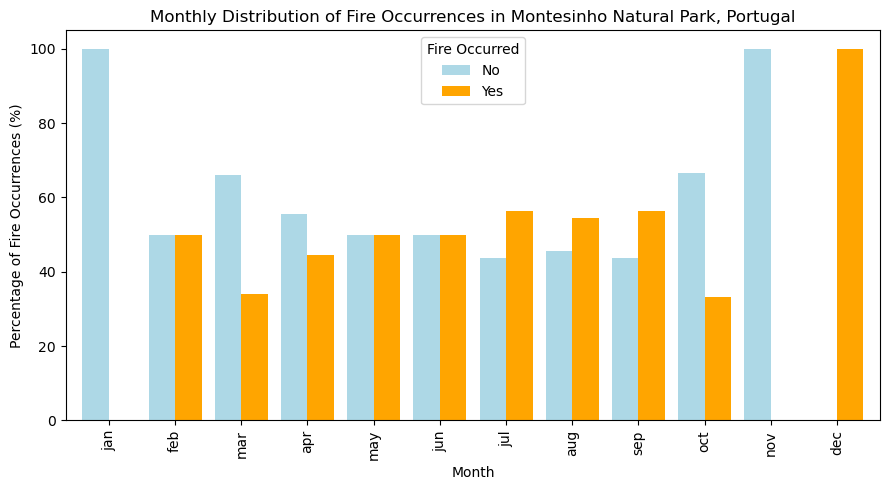

In [66]:
df['fire_occurred'] = df['area'].apply(lambda x: 'Yes' if x > 0 else 'No') #creates a new feature (feature engineering) to indicate if a fire occured or not using the area burned 

month_order = ['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec'] #sets the month order for plotting the figure

df['month'] = pd.Categorical(df['month'], categories=month_order, ordered=True) #ensures the month column is catergorical (previously received a warning message)
fire_recorded = df.groupby(['month', 'fire_occurred']).size().unstack(fill_value=0)  #counts the total number of no fires and fires recorded per month 

fire_occured_percentage = fire_recorded.div(fire_recorded.sum(axis=1), axis=0) * 100 #calculates the perecentage of fires and no fires recorded for each month

fire_occured_percentage.plot(
    kind='bar',
    color=['lightblue', 'orange'], #plots side by side bars for percentage fire occured (orange) and percentage no fire occured (lightblue)
    figsize=(9, 5),
    width=0.8
)

plt.title("Monthly Distribution of Fire Occurrences in Montesinho Natural Park, Portugal")
plt.xlabel("Month")
plt.ylabel("Percentage of Fire Occurrences (%)")
plt.legend(title='Fire Occurred')
plt.tight_layout()
plt.show()

#reference: https://seaborn.pydata.org/tutorial/distributions.html
#reference: https://github.com/sai-manas/FWI_Predictor_ML/blob/main/notebook/Algerian_forest_ML_project.ipynb

Seasonal fire occurence visualisation and analysis

<Figure size 1000x2000 with 0 Axes>

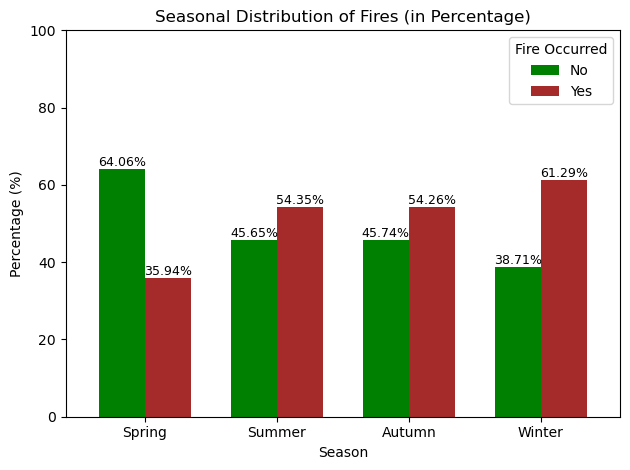

Seasonal Fire Occurrence Summary: 

fire_occurred  No Fire Recorded (No)  Fire Occurred (Yes)  Total Fires
season                                                                
Spring                            41                   23           64
Summer                           105                  125          230
Autumn                            86                  102          188
Winter                            12                   19           31


In [67]:
def get_season(month):     #function is used to map the months to their respective seasons
    spring = ["mar", "apr", "may"]
    summer = ["jun", "jul", "aug"]
    autumn = ["sep", "oct", "nov"]
    winter = ["dec", "jan", "feb"]
    if month in spring: return "Spring"
    if month in summer: return "Summer"
    if month in autumn: return "Autumn"
    if month in winter: return "Winter"

df["season"] = df["month"].apply(get_season) #reference: https://seasonsyear.com/Portugal
df['fire_occurred'] = df['area'].apply(lambda x: 'Yes' if x > 0 else 'No')
season_order = ["Spring", "Summer", "Autumn", "Winter"]
season_counts = df.groupby(['season', 'fire_occurred']).size().unstack(fill_value=0)


season_percent = (season_counts.div(season_counts.sum(axis=1), axis=0) * 100).reindex(season_order) #calculates the percentage fire occurences and non-fire occurrences per season


plt.figure(figsize=(10, 20))
ax = season_percent.plot(
    kind='bar',
    color={'Yes': 'brown', 'No': 'green'},
    #edgecolor='black',
    width=0.7
)
plt.ylim(0, 100)

plt.title("Seasonal Distribution of Fires (in Percentage)")
plt.xlabel("Season")
plt.ylabel("Percentage (%)")
plt.xticks(rotation=0)
plt.legend(title='Fire Occurred')

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f%%', fontsize=9, label_type='edge')  #adds the percentage value labels on top of each bar of the barplot 

plt.tight_layout()
plt.show()

#plots the seasonal fire occurrence as a summary table 
season_counts = df.groupby(["season", "fire_occurred"]).size().unstack(fill_value=0)
season_counts["Total Fires"] = season_counts.sum(axis=1)
season_order = ["Spring", "Summer", "Autumn", "Winter"]
season_counts = season_counts.reindex(season_order)
season_counts = season_counts.rename(columns={"Yes": "Fire Occurred (Yes)", "No": "No Fire Recorded (No)"})
print("Seasonal Fire Occurrence Summary: \n")
print(season_counts)

#reference: https://seaborn.pydata.org/tutorial/distributions.html
#reference: https://github.com/sai-manas/FWI_Predictor_ML/blob/main/notebook/Algerian_forest_ML_project.ipynb

Burned Area - Montesinho Natural Park 

Number of samples with burned area: 269
Number of samples with no burned area: 244


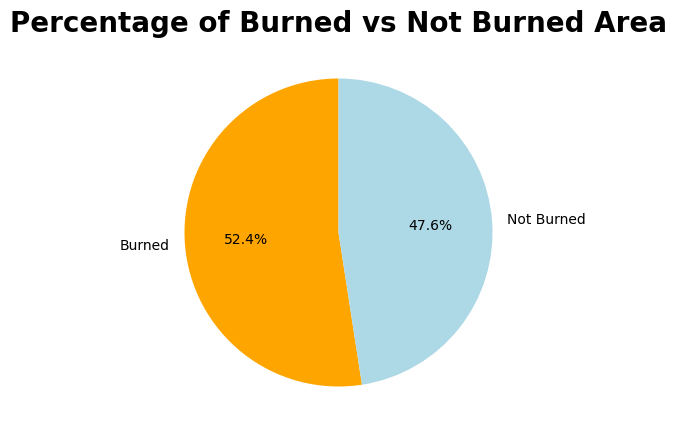

In [68]:
#plots the total burned area percentage vs not burned area percentage
burned_tot = (df['area'] > 0).sum()   
not_burned_tot = (df['area'] == 0).sum()

total = burned_tot + not_burned_tot
percentage = [burned_tot/total*100, not_burned_tot/total*100]

print(f"Number of samples with burned area: {burned_tot}")
print(f"Number of samples with no burned area: {not_burned_tot}")

plt.figure(figsize=(5, 5))
plt.pie(percentage, autopct="%1.1f%%", labels=["Burned","Not Burned"], 
        colors=['orange','lightblue'], startangle=90)
plt.title("Percentage of Burned vs Not Burned Area", weight="bold", fontsize=20)
plt.show()

#reference: https://github.com/sai-manas/FWI_Predictor_ML/blob/main/notebook/Algerian_forest_ML_project.ipynb

Correlation Heat Map 

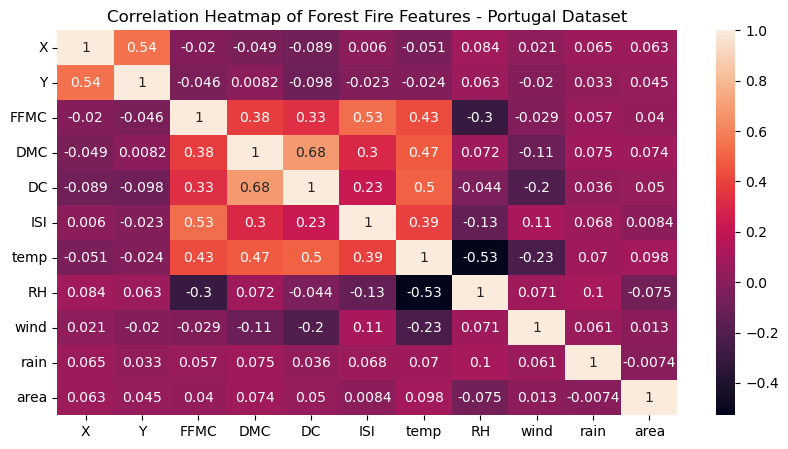

In [69]:
#plots the correlation heatmap 
corr_df = df.select_dtypes(include = [float, int])
corr_matrix = corr_df.corr()

plt.figure(figsize=(10, 5))
sns.heatmap(
    corr_matrix,
    annot=True,
)
plt.title("Correlation Heatmap of Forest Fire Features - Portugal Dataset")
plt.show()

#reference: https://python-graph-gallery.com/92-control-color-in-seaborn-heatmaps/
#reference: https://www.geeksforgeeks.org/python/how-to-create-a-seaborn-correlation-heatmap-in-python/

Handling of Catergorical Values 

In [70]:
#uses label encoding to map catergorical features to its respective numerical values for month, day, season, fire_occurred
month_map = {'jan':1, 'feb':2, 'mar':3, 'apr':4, 'may':5, 'jun':6,
             'jul':7, 'aug':8, 'sep':9, 'oct':10, 'nov':11, 'dec':12}
day_map = {'mon':1, 'tue':2, 'wed':3, 'thu':4, 'fri':5, 'sat':6, 'sun':7}

season_map = {'Spring':1, 'Summer':2, 'Autumn':3, 'Winter':4}
fire_occurred_map = {'Yes':1, 'No':0}

df['month'] = df['month'].map(month_map)
df['day'] = df['day'].map(day_map)
df['season'] = df['season'].map(season_map)
df['fire_occurred'] = df['fire_occurred'].map(fire_occurred_map)

#reference: https://pandas.pydata.org/docs/dev/reference/api/pandas.Categorical.map.html

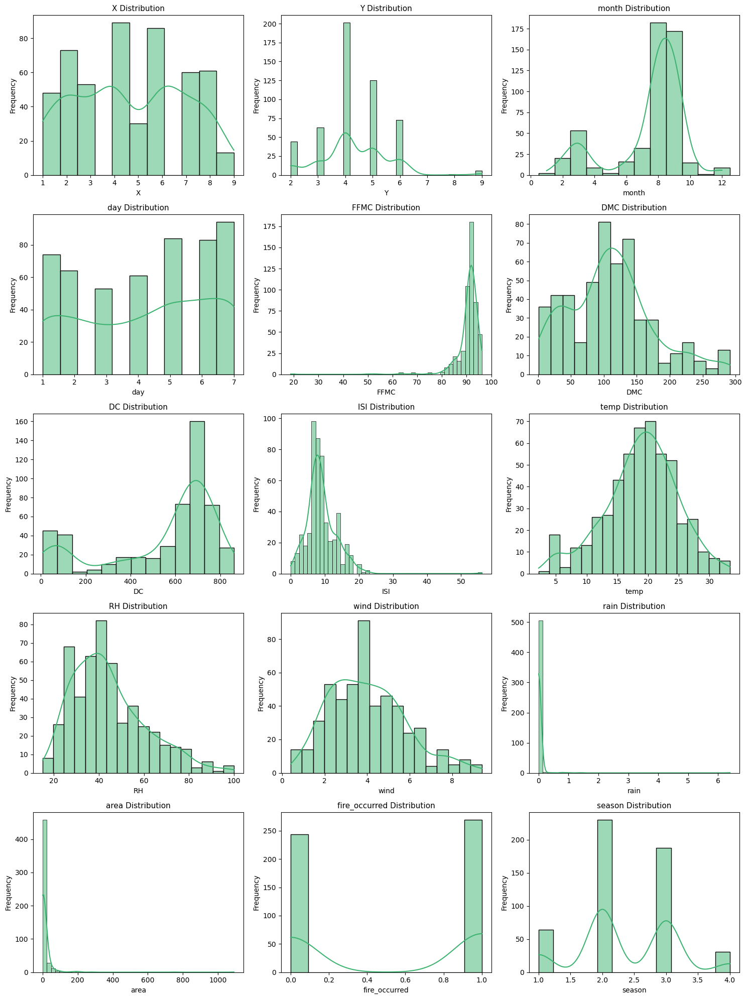

In [71]:

variables = df.columns #all columns in the dataset is used for distribution plotting
cols = 3  #sets the number of plots per row for the figure layout
rows = math.ceil(len(variables) / cols) #calculates the now of rows needed for the figure layout

plt.figure(figsize=(5*cols, 4*rows)) #sets the figure size based on the total number of rows and columns needed

for i, col in enumerate(variables, 1): #iterates thrugh each column 
    plt.subplot(rows, cols, i) #creates a subplot for each column 
    sns.histplot(df[col], kde=True, color='mediumseagreen', edgecolor='black') 
    plt.title(f'{col} Distribution', fontsize=11) #sets the title for each subplot
    plt.xlabel(col) #sets the x-axis label as the column name for each subplot
    plt.ylabel('Frequency') #sets the y-axis label as the frequency for each subplot 

plt.tight_layout()
plt.show()

#reference: https://www.w3schools.com/c/ref_math_ceil.php
#reference: https://www.w3schools.com/python/ref_func_enumerate.asp
#reference: https://www.statology.org/matplotlib-distribution-plot/

**Calculating FWI**

In [72]:
#following function is used to calculate BUI
def calculate_bui(row):
    dmc = row['DMC']
    dc = row['DC']
    if dmc <= 0.4 * dc:
        return (0.8 * dmc * dc) / (dmc + 0.4 * dc)
    else:
        return dmc - ((1 - (0.8 * dc / (dmc + 0.4 * dc))) * (0.92 + (0.0114 * dmc) ** 1.7))
          
#following function is used to calculate FWI    

def calculate_fwi(isi, bui):
    fD = np.where(
        bui <= 80,
        0.626 * (bui ** 0.809) + 2,
        1000 / (25 + 108.64 * np.exp(-0.023 * bui))
    )
    b = 0.1 * isi * fD
    b_safe = np.clip(b, 1e-6, None) # ensures b is not zero or negative to avoid log(0) or negative log
    fwi = np.where(
        b <= 1.0,
        b,
        np.exp(2.72 * (0.434 * np.log(b_safe)) ** 0.647)
    )
    return fwi

#calculates BUI using the function 
df['BUI'] = df.apply(calculate_bui, axis=1)

#calculates FWI using the function 
df['FWI'] = calculate_fwi(df['ISI'], df['BUI'])
y = df['FWI'] # creates a new column for the target variable FWI

print(df.head()) #confirms the new column have been added 

#reference:https://wikifire.wsl.ch/tiki-index259b.html?page=Fire+weather+index
#reference:https://wikifire.wsl.ch/tiki-index8720.html?page=Buildup+index

   X  Y month  day  FFMC   DMC     DC  ISI  temp  RH  wind  rain  area  \
0  7  5     3    5  86.2  26.2   94.3  5.1   8.2  51   6.7   0.0   0.0   
1  7  4    10    2  90.6  35.4  669.1  6.7  18.0  33   0.9   0.0   0.0   
2  7  4    10    6  90.6  43.7  686.9  6.7  14.6  33   1.3   0.0   0.0   
3  8  6     3    5  91.7  33.3   77.5  9.0   8.3  97   4.0   0.2   0.0   
4  8  6     3    7  89.3  51.3  102.2  9.6  11.4  99   1.8   0.0   0.0   

   fire_occurred  season        BUI        FWI  
0              0       1  30.921902  10.293590  
1              0       3  62.529409  18.709734  
2              0       3  75.406720  20.671156  
3              0       1  33.260199  16.736804  
4              0       1  51.150592  21.854667  


**Feature Scaling**

In [73]:
features = df.columns.drop('FWI') #all columns excepts FWI is used as the input features
target = 'FWI' #target variable is set as FWI

X = df[features]
y = df[target]

scaler = StandardScaler()  #standard scaler is used for feature scaling (z-score normalisation)
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns=features)

print("Summary after feature scaling:") #the statistical summary is displayed after feature scaling
print(X_scaled.describe().round(2))


Summary after feature scaling:
            X       Y   month     day    FFMC     DMC      DC     ISI    temp  \
count  513.00  513.00  513.00  513.00  513.00  513.00  513.00  513.00  513.00   
mean     0.00    0.00    0.00   -0.00   -0.00    0.00    0.00    0.00    0.00   
std      1.00    1.00    1.00    1.00    1.00    1.00    1.00    1.00    1.00   
min     -1.59   -1.87   -2.85   -1.57  -13.00   -1.71   -2.19   -1.97   -2.87   
25%     -0.72   -0.24   -0.21   -1.09   -0.08   -0.66   -0.44   -0.57   -0.58   
50%     -0.29   -0.24    0.23    0.36    0.17   -0.04    0.47   -0.14    0.07   
75%      1.00    0.57    0.67    0.84    0.41    0.49    0.67    0.43    0.67   
max      1.86    3.82    1.99    1.33    1.00    2.81    1.26   10.30    2.48   

           RH    wind    rain    area  fire_occurred  season     BUI  
count  513.00  513.00  513.00  513.00         513.00  513.00  513.00  
mean    -0.00   -0.00    0.00   -0.00           0.00   -0.00   -0.00  
std      1.00    1.00    1

Box plot visualisation 

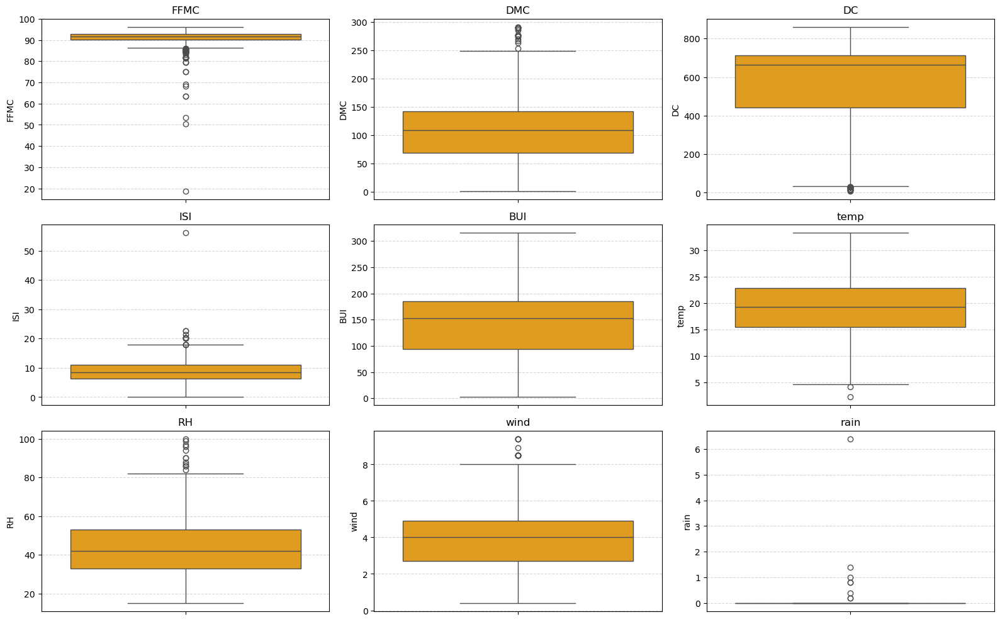

In [74]:

#box plot visualisation of the features after feature scaling
features = ["FFMC", "DMC", "DC", "ISI", "BUI", "temp", "RH", "wind", "rain"] #only the most relevant features are plotted (research is based on weather data and fire indices)

plt.figure(figsize=(16, 10))
for i, feature in enumerate(features, 1):
    plt.subplot(3, 3, i)      #creates a subplot for each feature and includes it in a 3 by 3 grid layout
    sns.boxplot(y=df[feature], color="orange")
    plt.title(feature)
    plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()
#reference: https://stackoverflow.com/questions/59593943/multiple-boxplots-of-all-categorical-variables-in-one-plotting-window-using-seab

Handling of Outliers

Original dataset size: 513
Dataset size after capping outliers: 513


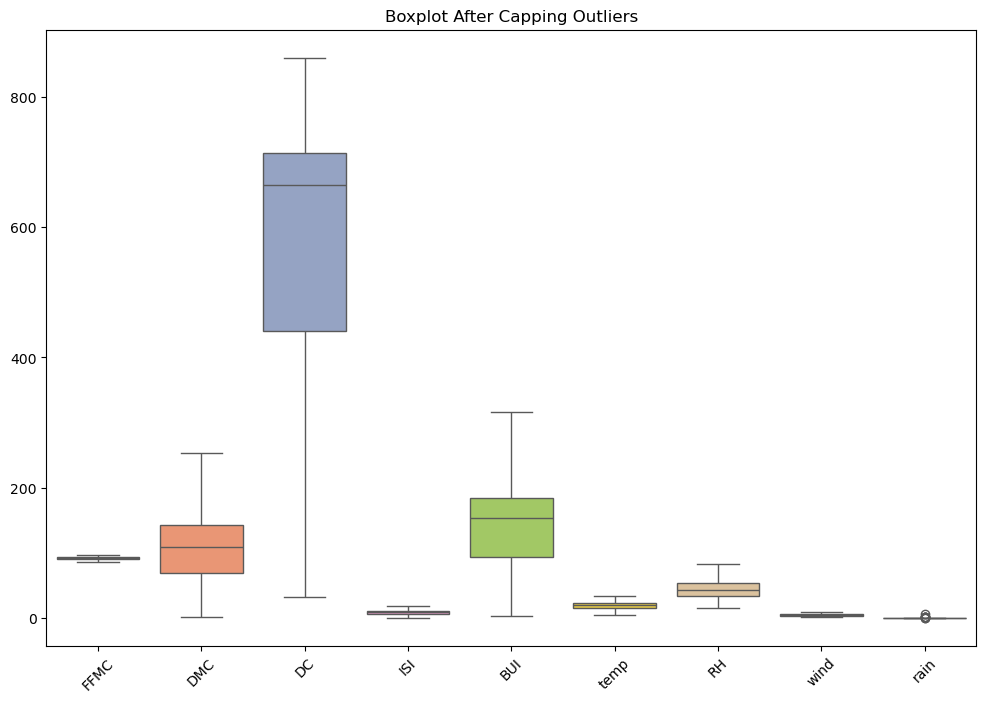

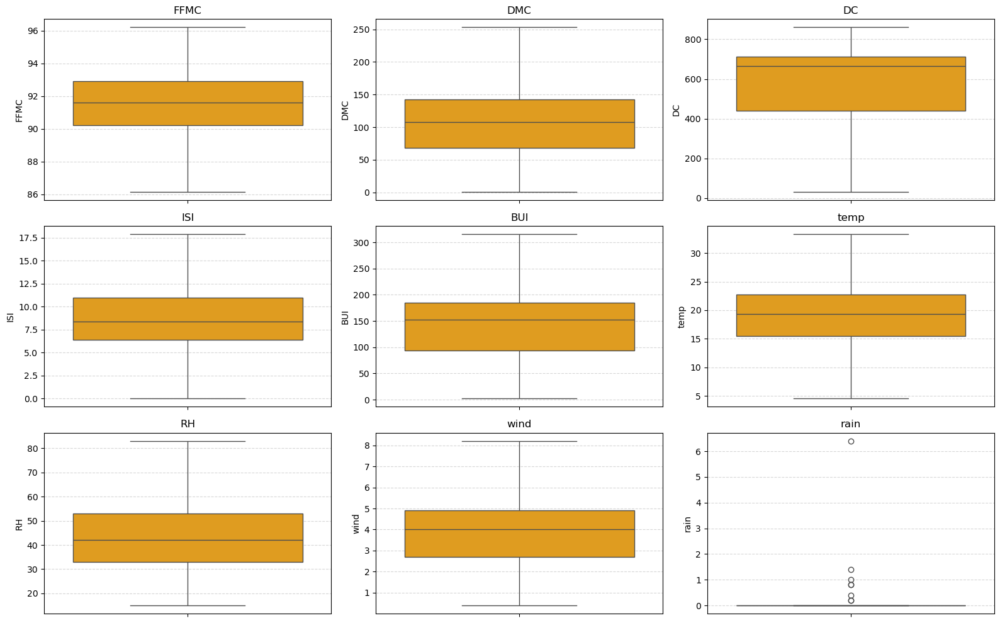

In [75]:

# following fuction is used to limit extreme values using IQR method

def cap_outliers(df, columns, factor=1.5): # k = 1.5 
    df = df.copy()
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - factor * IQR
        upper = Q3 + factor * IQR
        df[col] = np.clip(df[col], lower, upper) #caps/replaces values outside the lower and upper bounds 
    return df

features = ['FFMC', 'DMC', 'DC', 'ISI', 'BUI', 'temp', 'RH', 'wind'] #most relavant features (numerical) for the FWI is used, and rain is not used
#Rain is not used because if used all values tend to be approximated tp zero, which result in a no relationship when Pearson correlation is applied.

df = cap_outliers(df, features) #caps the outliers using the preivously defined function (cap_outliers)

print(f"Original dataset size: {df.shape[0]}")
print(f"Dataset size after capping outliers: {df.shape[0]}")  # prints the size of the dataset after capping outliers to ensure the size is unchanged


scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[features +['rain']]) #features scales the capped dataset

#plots boxplots to visualise the capped outliers and ensure no outliers are present
plt.figure(figsize=(12,8))
sns.boxplot(data=df[features+['rain']], palette="Set2")
plt.title("Boxplot After Capping Outliers")
plt.xticks(rotation=45)
plt.show()

# plots individual boxplots for a better visualisation of each feature in a 3 by 3 grid layout (easier to compare with the previous boxplot before capping)
plt.figure(figsize=(16, 10))
for i, feature in enumerate(features+['rain'], 1):
    plt.subplot(3, 3, i)
    sns.boxplot(y=df[feature], color="orange")
    plt.title(feature)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()
#reference: https://www.geeksforgeeks.org/data-visualization/box-plot-in-python-using-matplotlib/
#reference: https://stackoverflow.com/questions/42207920/how-to-take-floor-and-capping-for-removing-outliers
#reference: https://stackoverflow.com/questions/59593943/multiple-boxplots-of-all-categorical-variables-in-one-plotting-window-using-seab

**Feature Importance**

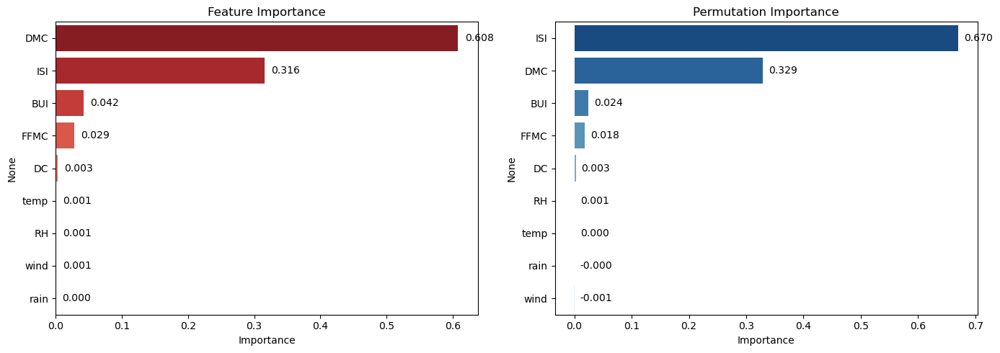

Feature Importance Comparison:
      Built-in  Permutation
BUI      0.042        0.024
DC       0.003        0.003
DMC      0.608        0.329
FFMC     0.029        0.018
ISI      0.316        0.670
RH       0.001        0.001
rain     0.000       -0.000
temp     0.001        0.000
wind     0.001       -0.001


In [76]:

features = ['FFMC', 'DMC', 'DC', 'ISI', 'BUI', 'temp', 'RH', 'wind', 'rain'] #same most relevant features as before is used 
target = 'FWI'

X = df[features] #capped dataset is used for training the RF model 
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) #data is split into 80% training and 20% testing

model = RandomForestRegressor(n_estimators=100, random_state=42) #random forest regressor model is used with 100 trees/estimators 
model.fit(X_train, y_train)

#mdi feature importance and permutation feature importance are calculated
mdi_importances = pd.Series(model.feature_importances_, index=features).sort_values(ascending=False) #built-in feature importance from the random forest model 
perm_result = permutation_importance(model, X_test, y_test, n_repeats=10, random_state=42) 
perm_importances = pd.Series(perm_result.importances_mean, index=features).sort_values(ascending=False)


fig, axes = plt.subplots(1, 2, figsize=(14, 5))


sns.barplot(x=mdi_importances.values, y=mdi_importances.index, hue=mdi_importances.index, # Plot for MDI - built-in feature importance
            palette='Reds_r', ax=axes[0], legend=False)
axes[0].set_title('Feature Importance')
axes[0].set_xlabel('Importance')

for i, v in enumerate(mdi_importances.values): #values for each bar is added on the barplot
    axes[0].text(v + 0.01, i, f'{v:.3f}', va='center', fontsize=10)


sns.barplot(x=perm_importances.values, y=perm_importances.index, hue=perm_importances.index, # Second plot is for the permutation feature importance
            palette='Blues_r', ax=axes[1], legend=False)
axes[1].set_title('Permutation Importance')
axes[1].set_xlabel('Importance')

for i, v in enumerate(perm_importances.values): #values for each bar is added on the barplot via a for loop
    axes[1].text(v + 0.01, i, f'{v:.3f}', va='center', fontsize=10)

plt.tight_layout()
plt.show()


print("Feature Importance Comparison:") #feature comparison table is printed (additional - this gives an easier comparison between the two feature importance figures)
print(pd.DataFrame({'Built-in': mdi_importances, 'Permutation': perm_importances}).round(3))

#reference: https://www.geeksforgeeks.org/machine-learning/feature-importance-with-random-forests/ (built-in feature importance)
#reference: https://scikit-learn.org/stable/modules/permutation_importance.html
#reference: https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py

Pearson Correlation 

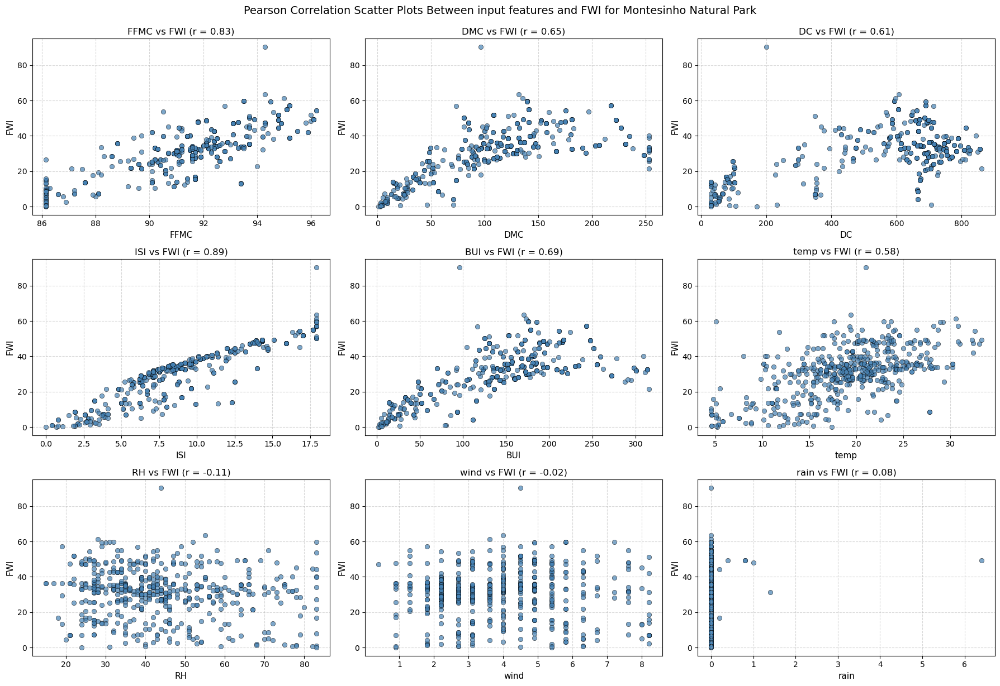

Pearson correlation coefficients for features and FWI:
FFMC: 0.829
DMC: 0.651
DC: 0.609
ISI: 0.891
BUI: 0.690
temp: 0.581
RH: -0.115
wind: -0.023
rain: 0.081


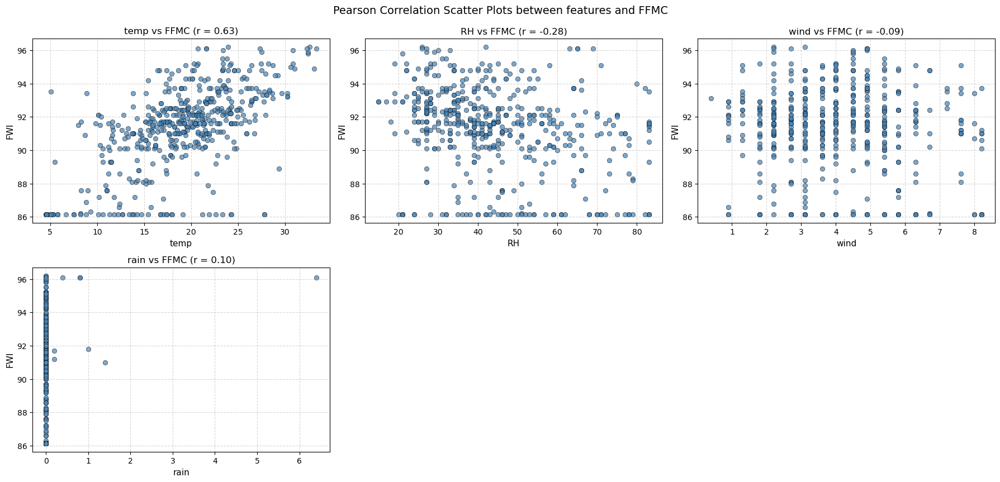

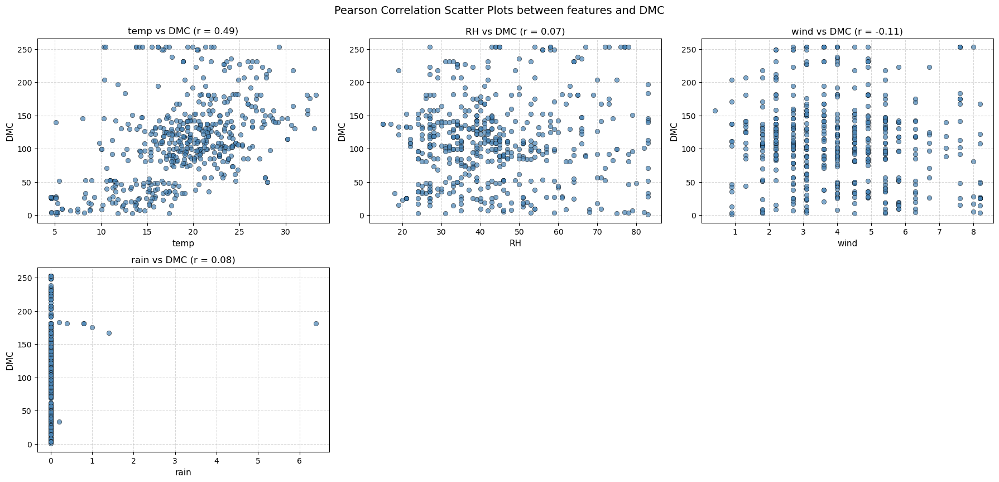

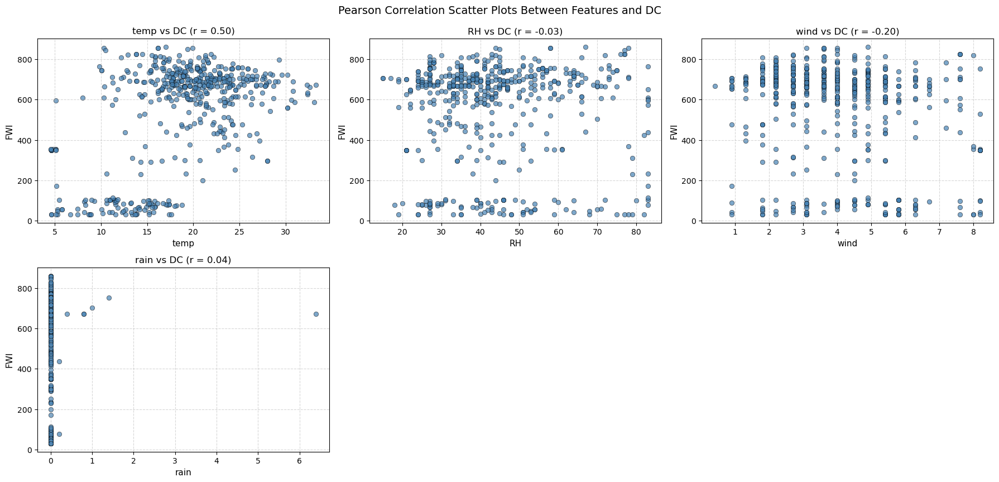

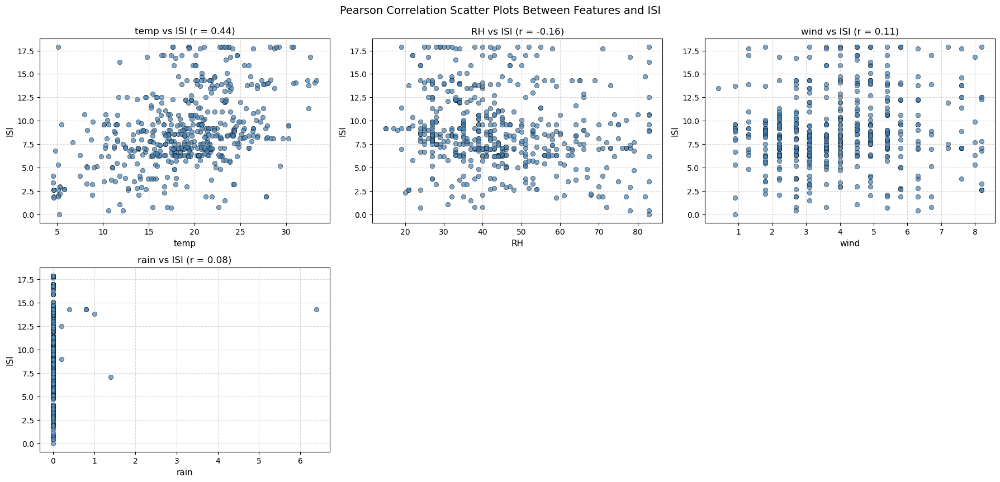

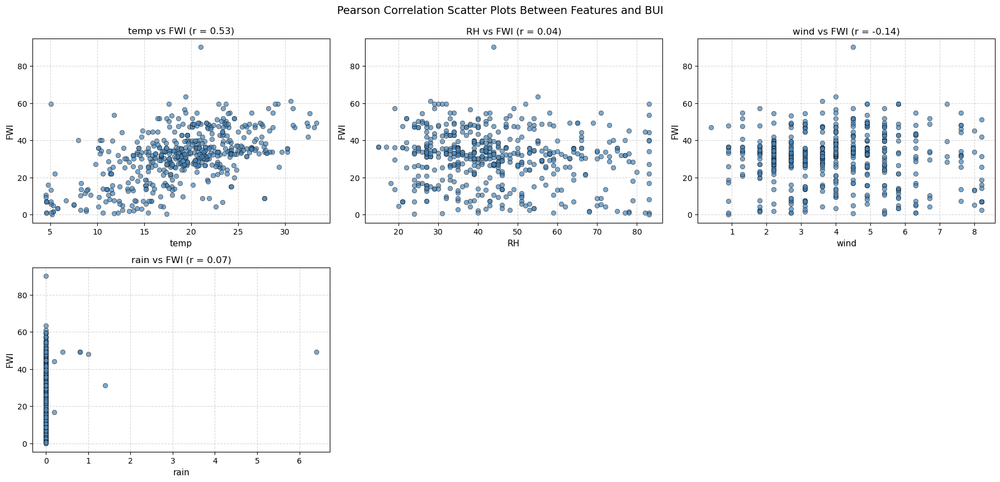

In [77]:
X = df[features]  #input features that include the following columns ('FFMC', 'DMC', 'DC', 'ISI', 'BUI', 'temp', 'RH', 'wind', 'rain)             
y = df['FWI']     #target output feature 


def covariance(X, y): #calculates the mean differences between the variables
    x_mean = np.mean(X)
    y_mean = np.mean(y)
    return sum((X[i] - x_mean) * (y[i] - y_mean) for i in range(len(X))) / len(X)

def pearson_correlation(X, y): #function to calculate pearson correlation matrix
    cov = covariance(X, y)
    std_dev_x = np.std(X)
    std_dev_y = np.std(y)
    if std_dev_x == 0 or std_dev_y == 0: 
        return np.nan  
    return cov / (std_dev_x * std_dev_y) #divides the calculated value in covariance function by the standard deviation (this value is the pearson correlation coefficient and it shows the relationship between the input feature and the output featue)

plt.figure(figsize=(18, 12))
for i, feature in enumerate(features, 1): #plots the scatter plot (this shows the relationship between the intput feature and the output feature)
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[feature],
        y=df['FWI'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    
    if np.std(df[feature]) == 0 or np.std(df['FWI']) == 0:  #Calculates Pearson correlation coefficent for each feature
        r = np.nan
    else:
        r = np.corrcoef(df[feature], df['FWI'])[0, 1]

    plt.title(f'{feature} vs FWI (r = {r:.2f})', fontsize=12) #plots the scatter plot
    plt.xlabel(feature, fontsize=11)
    plt.ylabel('FWI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between input features and FWI for Montesinho Natural Park", fontsize=14, y=1.02)
plt.show()


#(Additional), the pearson coeffficents for each feature is printed 
correlations = {}
for col in X.columns:
    correlations[col] = pearson_correlation(X[col].values, y.values)

print("Pearson correlation coefficients for features and FWI:")
for feature, r in correlations.items():
    print(f"{feature}: {r:.3f}")


#the following pearson correlation coefficients are found and scatter plots are plotted for each index to get a better understanding about the feature relations 
features = ['temp', 'RH', 'wind', 'rain'] #Pearson correlation for FFMC
X = df[features]               
y = df['FFMC']

plt.figure(figsize=(18, 12))
for i, feature in enumerate(features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[feature],
        y=df['FFMC'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    
    if np.std(df[feature]) == 0 or np.std(df['FFMC']) == 0: # Calculates correlation for each feature
        r = np.nan
    else:
        r = np.corrcoef(df[feature], df['FFMC'])[0, 1]

    plt.title(f'{feature} vs FFMC (r = {r:.2f})', fontsize=12)
    plt.xlabel(feature, fontsize=11)
    plt.ylabel('FWI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots between features and FFMC", fontsize=14, y=1.02)
plt.show()

#Pearson correlation for DMC
features = ['temp', 'RH', 'wind', 'rain']
X = df[features]               
y = df['DMC']

plt.figure(figsize=(18, 12))
for i, feature in enumerate(features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[feature],
        y=df['DMC'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    
    if np.std(df[feature]) == 0 or np.std(df['DMC']) == 0: # Calculates correlation for each feature
        r = np.nan
    else:
        r = np.corrcoef(df[feature], df['DMC'])[0, 1]

    plt.title(f'{feature} vs DMC (r = {r:.2f})', fontsize=12)
    plt.xlabel(feature, fontsize=11)
    plt.ylabel('DMC', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots between features and DMC", fontsize=14, y=1.02)
plt.show()

#pearson correlation for DC
features = ['temp', 'RH', 'wind', 'rain'] 
X = df[features]               
y = df['DC']

plt.figure(figsize=(18, 12))
for i, feature in enumerate(features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[feature],
        y=df['DC'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    # Calculates correlation for each feature
    if np.std(df[feature]) == 0 or np.std(df['DC']) == 0: 
        r = np.nan
    else:
        r = np.corrcoef(df[feature], df['DC'])[0, 1]

    plt.title(f'{feature} vs DC (r = {r:.2f})', fontsize=12)
    plt.xlabel(feature, fontsize=11)
    plt.ylabel('FWI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between Features and DC", fontsize=14, y=1.02)
plt.show()

#pearson correlation for ISI
features = ['temp', 'RH', 'wind', 'rain']
X = df[features]               
y = df['ISI']

plt.figure(figsize=(18, 12))
for i, feature in enumerate(features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[feature],
        y=df['ISI'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    # Calculates correlation for each feature
    if np.std(df[feature]) == 0 or np.std(df['ISI']) == 0:
        r = np.nan
    else:
        r = np.corrcoef(df[feature], df['ISI'])[0, 1]

    plt.title(f'{feature} vs ISI (r = {r:.2f})', fontsize=12)
    plt.xlabel(feature, fontsize=11)
    plt.ylabel('ISI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between Features and ISI", fontsize=14, y=1.02)
plt.show()

#pearson correlation for BUI
features = ['temp', 'RH', 'wind', 'rain']
X = df[features]               
y = df['BUI']

plt.figure(figsize=(18, 12))
for i, feature in enumerate(features, 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(
        x=df[feature],
        y=df['FWI'],
        color='steelblue',
        alpha=0.7,
        edgecolor='black'
    )
    
    if np.std(df[feature]) == 0 or np.std(df['BUI']) == 0:  # Calculates correlation for each feature
        r = np.nan
    else:
        r = np.corrcoef(df[feature], df['BUI'])[0, 1]

    plt.title(f'{feature} vs FWI (r = {r:.2f})', fontsize=12)
    plt.xlabel(feature, fontsize=11)
    plt.ylabel('FWI', fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.suptitle("Pearson Correlation Scatter Plots Between Features and BUI", fontsize=14, y=1.02)
plt.show()

#reference: https://medium.com/@shivogojohn/pearson-correlation-coefficient-in-python-74fb569f2b7f

**Model Development**

Model 1 - using all input features 

With Hyperparameter tuning (Optuna)

[I 2025-11-09 14:59:04,382] A new study created in memory with name: no-name-d98885e1-fd36-472b-9c0b-5fe1e1af6014


  0%|          | 0/1000 [00:00<?, ?it/s]

[0]	test-rmse:11.83344
[1]	test-rmse:9.01489
[2]	test-rmse:7.06738
[3]	test-rmse:5.85921
[4]	test-rmse:4.66338
[5]	test-rmse:3.84466
[6]	test-rmse:3.28173
[7]	test-rmse:2.91155
[8]	test-rmse:2.70811
[9]	test-rmse:2.59314
[10]	test-rmse:2.49704
[11]	test-rmse:2.44787
[12]	test-rmse:2.40866
[13]	test-rmse:2.38531
[14]	test-rmse:2.26182
[15]	test-rmse:2.19608
[16]	test-rmse:2.15991
[17]	test-rmse:2.13892
[18]	test-rmse:2.08960
[19]	test-rmse:2.07715
[20]	test-rmse:2.02319
[21]	test-rmse:2.00549
[22]	test-rmse:1.99794
[23]	test-rmse:1.97846
[24]	test-rmse:1.96556
[25]	test-rmse:1.96294
[26]	test-rmse:1.94633
[27]	test-rmse:1.96080
[28]	test-rmse:1.93959
[29]	test-rmse:1.93266
[30]	test-rmse:1.89455
[31]	test-rmse:1.89599
[32]	test-rmse:1.87884
[33]	test-rmse:1.87007
[34]	test-rmse:1.85966
[35]	test-rmse:1.85587
[36]	test-rmse:1.84208
[37]	test-rmse:1.84087
[38]	test-rmse:1.83516
[39]	test-rmse:1.82672
[40]	test-rmse:1.82740
[41]	test-rmse:1.82412
[42]	test-rmse:1.82943
[43]	test-rmse:1.830

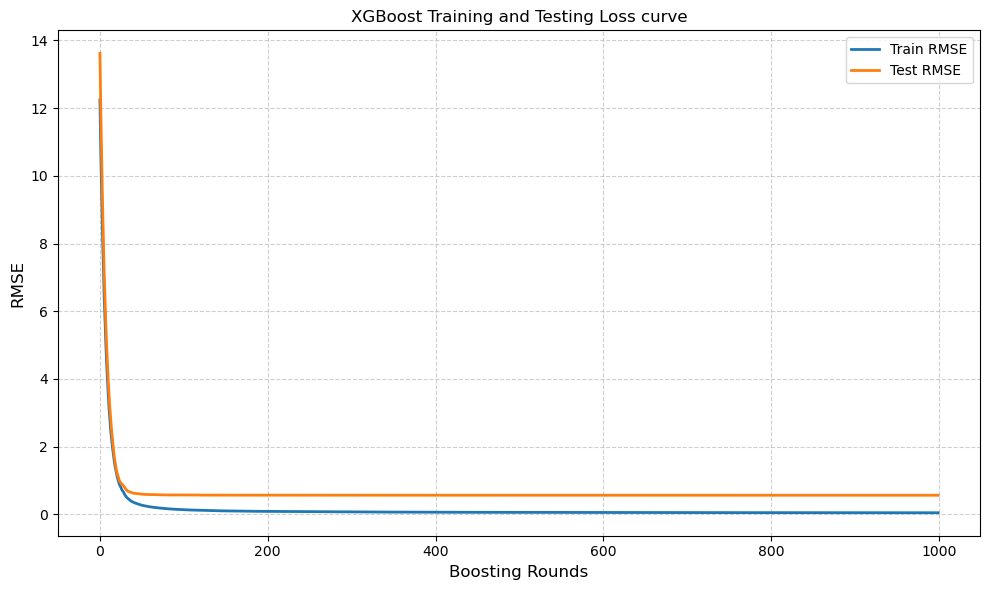

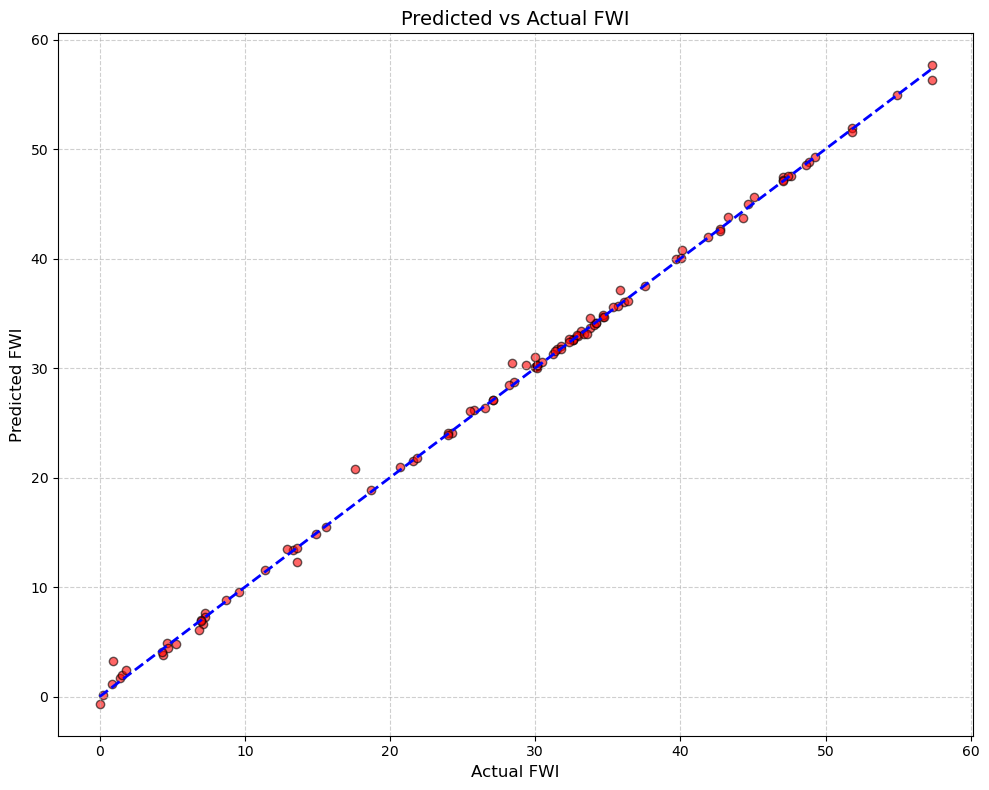

In [78]:

features = ['temp', 'RH', 'wind', 'rain', 'FFMC', 'DMC', 'DC', 'ISI', 'BUI']
target = 'FWI'

X = df[features]
y = df[target]


X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0) #splits the dataset to 80% training and 20% testing 

xgb_train = xgb.DMatrix(X_train, y_train) #converts the inputs to a DMatrix object 
xgb_test = xgb.DMatrix(X_test, y_test)


def objective(trial): #the hyperparameter tuning objective function is defined 
    params = {
        "objective": "reg:squarederror",
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.5),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "lambda": trial.suggest_float("lambda", 1e-8, 5),
        "alpha": trial.suggest_float("alpha", 1e-8, 5),
        "seed": 42
    }
    
    model = xgb.train(params=params, dtrain=xgb_train, num_boost_round=100, #model is trained using the intially defined parameters
                      evals=[(xgb_test, 'test')],
                      verbose_eval=True)
    
    preds = model.predict(xgb_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000, show_progress_bar=True)
best_params = study.best_params.copy()
best_params['objective'] = 'reg:squarederror'
best_params['seed'] = 42
print ("Best hyperparameters:", best_params)  #using optuna the best parameters are found 

#loss curve plotting
evals_result = {}
final_model = xgb.train(   #the final model is trained on the best parameters
    params=best_params,
    dtrain=xgb_train,
    num_boost_round=1000,
    evals=[(xgb_train, 'train'), (xgb_test, 'test')],
    evals_result=evals_result,
    verbose_eval=True
)

preds = final_model.predict(xgb_test)   
r2 = r2_score(y_test, preds)
rmse = np.sqrt(mean_squared_error(y_test, preds))
mae = np.mean(np.abs((y_test - preds)))

print(f"R² Score: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")
print(f"MAE: {mae:.3f}")

train_rmse_val = evals_result['train']['rmse']
test_rmse_val = evals_result['test']['rmse']

plt.figure(figsize=(10, 6))
plt.plot(train_rmse_val, label='Train RMSE', linewidth=2)
plt.plot(test_rmse_val, label='Test RMSE', linewidth=2)
plt.xlabel('Boosting Rounds', fontsize=12)
plt.ylabel('RMSE', fontsize=12)
plt.title('XGBoost Training and Testing Loss curve', fontsize=12) #loss curve is plotted
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
plt.scatter(y_test, preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2)  #Predicted VS Actual plot is plotted
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show() 
 

#reference: https://www.geeksforgeeks.org/machine-learning/implementation-of-xgboost-extreme-gradient-boosting/
#reference: https://xgboost.readthedocs.io/en/stable/python/examples/evals_result.html
#reference: hhttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/ttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/   (to confirm the shape of the learning curve)
#reference: https://github.com/ishandandekar/misc/blob/8711f9bcd8866ed3f220b2bf3f647993c6884283/xgboost_optuna.py#L15-L17

XGBoost model without hyperparameter tuning

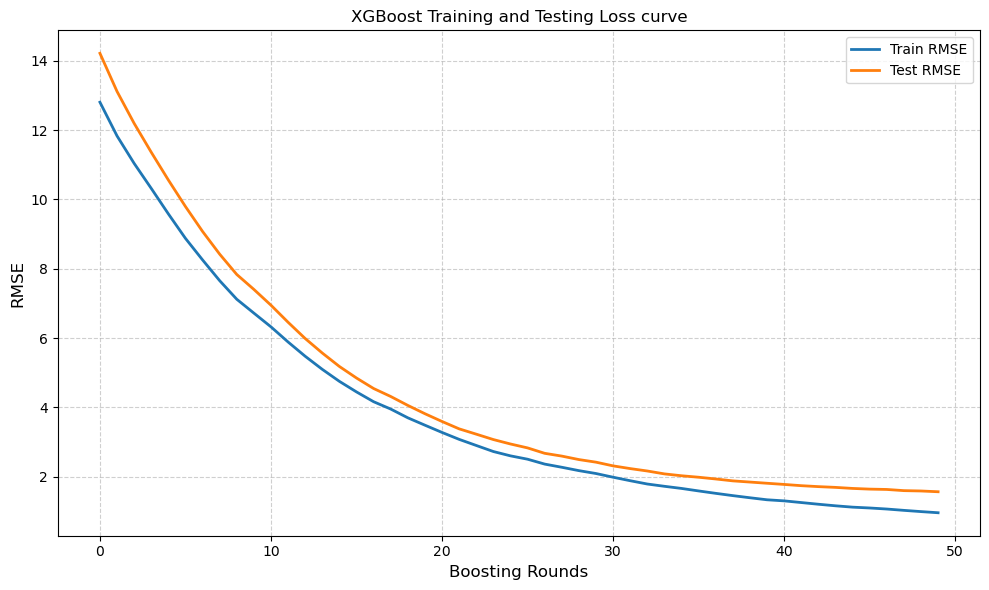

R² Score: 0.989
RMSE: 1.563
MAE: 0.780


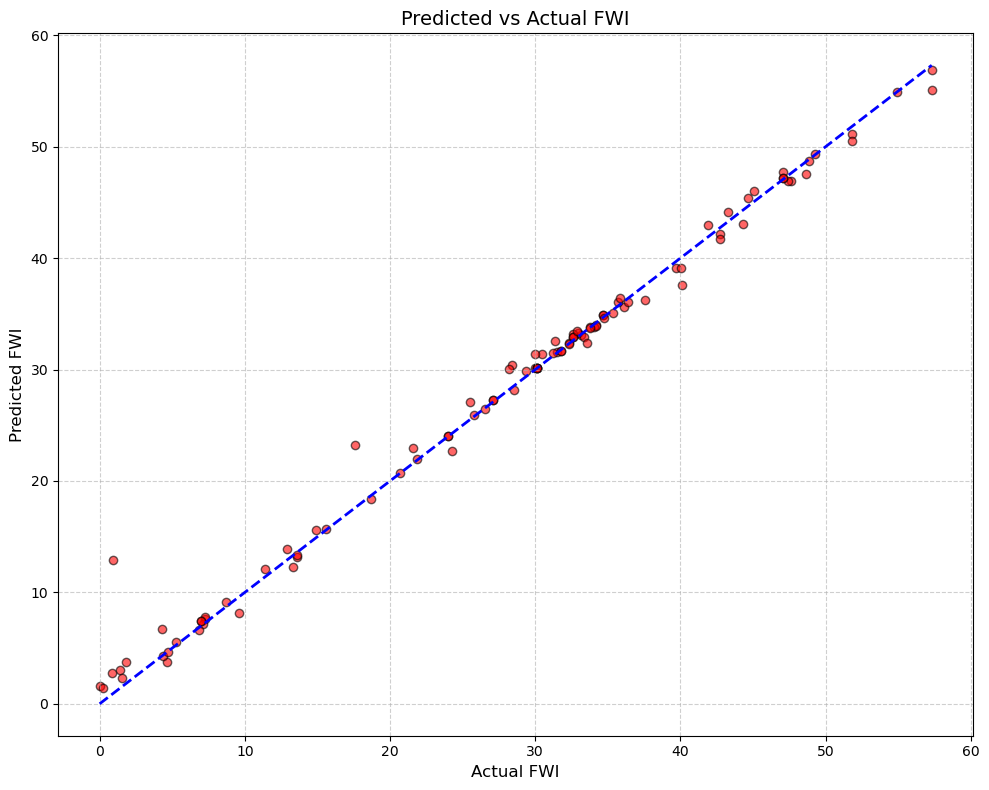

In [79]:

features = ['temp', 'RH', 'wind', 'rain', 'FFMC', 'DMC', 'DC', 'ISI', 'BUI'] #input features 
target = 'FWI' #target variable 

X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0) #splits the dataset to 80% training and 20% testing 


xgb_train = xgb.DMatrix(X_train, y_train) #converts the inputs to a DMatrix object 
xgb_test = xgb.DMatrix(X_test, y_test)

#Parameters for the XGBoost model is defined 
params = { 
    "objective": "reg:squarederror",
    "learning_rate": 0.0835,
    "max_depth": 4,
    "subsample": 0.8,
    "colsample_bytree": 0.8,
    "lambda": 1,
    "alpha": 0.1,
    "seed": 42
}
n=50 #number of boosting rounds/n_estimators = n is set to 50

evals_result = {} #stores the training and testing evaluation values 

model = xgb.train(params=params,dtrain=xgb_train,num_boost_round=n, evals=[(xgb_train, 'train'), (xgb_test, 'test')],evals_result=evals_result, verbose_eval=False) #model is trained 

train_rmse_val = evals_result['train']['rmse'] #all training rmse values are extracted
test_rmse_val = evals_result['test']['rmse'] #all testing rmse values are extracted

plt.figure(figsize=(10, 6)) #loss curve is plotted using the rmse values for training and testing 
plt.plot(train_rmse_val, label='Train RMSE', linewidth=2)
plt.plot(test_rmse_val, label='Test RMSE', linewidth=2)
plt.xlabel('Boosting Rounds', fontsize=12)
plt.ylabel('RMSE', fontsize=12)
plt.title('XGBoost Training and Testing Loss curve', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

preds = model.predict(xgb_test)  #the FWI is predicted for the testing dataset 
r2 = r2_score(y_test, preds)     #calculates the r2 value
rmse = np.sqrt(mean_squared_error(y_test, preds)) #calculates the RMSE value
mae = np.mean(np.abs((y_test - preds))) #calculates the mean absolute error

print(f"R² Score: {r2:.3f}") #r2 score is calculated
print(f"RMSE: {rmse:.3f}") #rmse score is calculated
print(f"MAE: {mae:.3f}") #Mean absolute error is calculaeted

plt.figure(figsize=(10, 8))
plt.scatter(y_test, preds, color='red', alpha=0.6, edgecolor='black') #the predicted Vs Actual plot is plotted 
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()





**Model 2 - Only weather data**

1) XGBoost

[I 2025-11-09 15:04:18,066] A new study created in memory with name: no-name-421792af-491d-4404-88ba-cf9a39e2edb3


  0%|          | 0/1000 [00:00<?, ?it/s]

[0]	test-rmse:13.92087
[1]	test-rmse:13.49211
[2]	test-rmse:13.41808
[3]	test-rmse:12.67105
[4]	test-rmse:12.42280
[5]	test-rmse:12.43472
[6]	test-rmse:12.34644
[7]	test-rmse:12.28178
[8]	test-rmse:12.33738
[9]	test-rmse:12.40607
[10]	test-rmse:12.39729
[11]	test-rmse:12.36779
[12]	test-rmse:12.44001
[13]	test-rmse:12.45017
[14]	test-rmse:12.43533
[15]	test-rmse:12.40212
[16]	test-rmse:12.38832
[17]	test-rmse:12.36055
[18]	test-rmse:12.36871
[19]	test-rmse:12.38659
[20]	test-rmse:12.36761
[21]	test-rmse:12.34546
[22]	test-rmse:12.34417
[23]	test-rmse:12.35986
[24]	test-rmse:12.36061
[25]	test-rmse:12.36743
[26]	test-rmse:12.37728
[27]	test-rmse:12.38978
[28]	test-rmse:12.38707
[29]	test-rmse:12.38745
[30]	test-rmse:12.40362
[31]	test-rmse:12.41066
[32]	test-rmse:12.40579
[33]	test-rmse:12.39600
[34]	test-rmse:12.39736
[35]	test-rmse:12.39780
[36]	test-rmse:12.39813
[37]	test-rmse:12.39209
[38]	test-rmse:12.39395
[39]	test-rmse:12.39126
[40]	test-rmse:12.39416
[41]	test-rmse:12.39493
[4

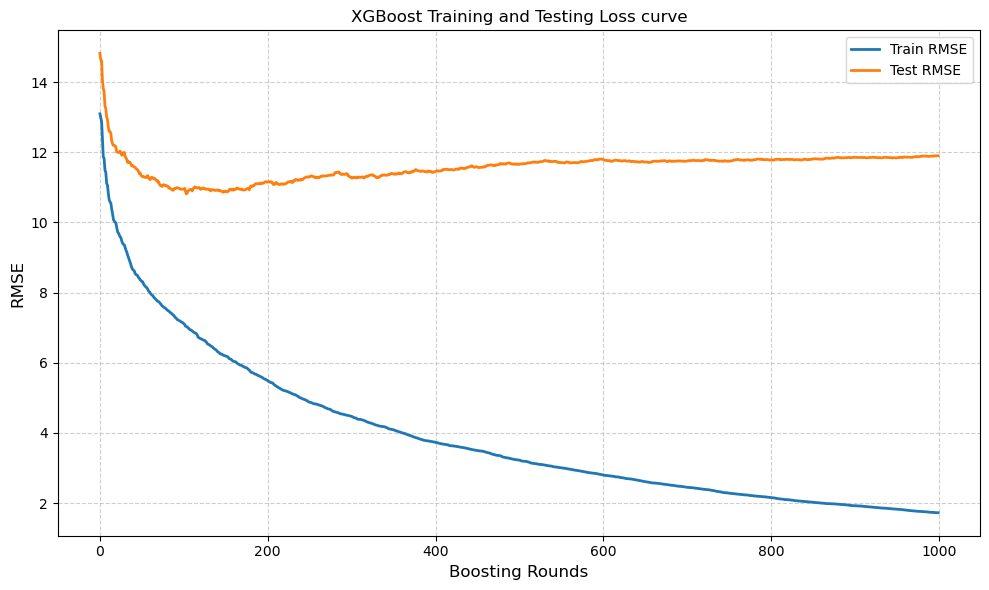

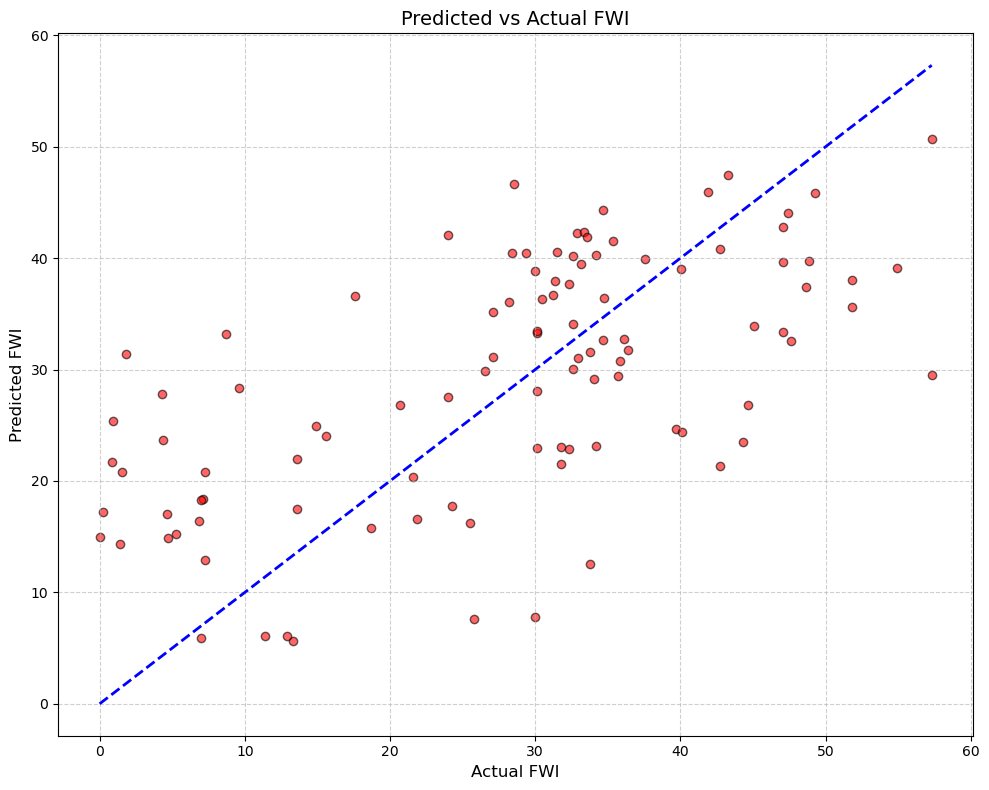

In [80]:


features = ['temp', 'RH', 'wind', 'rain', 'area', 'day', 'Y', 'X'] #input features used
target = 'FWI' #target variable

X = df[features] #input features
y = df[target]  #target

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=0) #splits the dataset to 80% training and 20% testing 

xgb_train = xgb.DMatrix(X_train, y_train) #converts the inputs to a DMatrix object 
xgb_test = xgb.DMatrix(X_test, y_test)


def objective(trial): #the hyperparameter tuning objective function is defined 
    params = {
        "objective": "reg:squarederror",
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.5),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "lambda": trial.suggest_float("lambda", 1e-8, 5),
        "alpha": trial.suggest_float("alpha", 1e-8, 5),
        "seed": 42
    }
    
    model = xgb.train(params=params, dtrain=xgb_train, num_boost_round=100, #model is trained using the intially defined parameters
                      evals=[(xgb_test, 'test')],
                      verbose_eval=True)
    
    preds = model.predict(xgb_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=1000, show_progress_bar=True)
best_params = study.best_params.copy()
best_params['objective'] = 'reg:squarederror'
best_params['seed'] = 42
print ("Best hyperparameters:", best_params)  #using optuna the best parameters are found 


evals_result = {}
final_model = xgb.train(   #the final model is trained on the best parameters
    params=best_params,
    dtrain=xgb_train,
    num_boost_round=1000,
    evals=[(xgb_train, 'train'), (xgb_test, 'test')],
    evals_result=evals_result,
    verbose_eval=True
)

preds = final_model.predict(xgb_test)   #the FWI is predicted for the testing dataset 
r2 = r2_score(y_test, preds)   #calculates the r2 value
rmse = np.sqrt(mean_squared_error(y_test, preds))  #calculates the RMSE value
mae = np.mean(np.abs((y_test - preds)))#calculates the mean absolute error

print(f"R² Score: {r2:.3f}") #r2 score is calculated
print(f"RMSE: {rmse:.3f}") #rmse score is calculated
print(f"MAE: {mae:.3f}") #Mean absolute error is calculaeted

train_rmse_val = evals_result['train']['rmse'] #all training rmse values are extracted
test_rmse_val = evals_result['test']['rmse'] #all testing rmse values are extracted

plt.figure(figsize=(10, 6))
plt.plot(train_rmse_val, label='Train RMSE', linewidth=2)
plt.plot(test_rmse_val, label='Test RMSE', linewidth=2)
plt.xlabel('Boosting Rounds', fontsize=12)
plt.ylabel('RMSE', fontsize=12)
plt.title('XGBoost Training and Testing Loss curve', fontsize=12) #loss curve is plotted
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
plt.scatter(y_test, preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2)  #Predicted VS Actual plot is plotted
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show() 

#reference: https://www.geeksforgeeks.org/machine-learning/implementation-of-xgboost-extreme-gradient-boosting/
#reference: https://xgboost.readthedocs.io/en/stable/python/examples/evals_result.html
#reference: hhttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/ttps://machinelearningmastery.com/tune-xgboost-performance-with-learning-curves/   (to confirm the shape of the learning curve)
#reference: https://github.com/ishandandekar/misc/blob/8711f9bcd8866ed3f220b2bf3f647993c6884283/xgboost_optuna.py#L15-L17

XGBoost Regressor 

[I 2025-11-09 15:09:06,231] A new study created in memory with name: no-name-e6d7329d-e876-4b25-9c92-549a7a7b7a22
[I 2025-11-09 15:09:06,472] Trial 0 finished with value: 11.976930089635092 and parameters: {'n_estimators': 298, 'max_depth': 10, 'learning_rate': 0.14061028427821678, 'subsample': 0.8611857873452108, 'colsample_bytree': 0.8148582185966857, 'reg_lambda': 3.6982098936963506, 'reg_alpha': 1.6641351027871742}. Best is trial 0 with value: 11.976930089635092.
[I 2025-11-09 15:09:06,896] Trial 1 finished with value: 12.787675368246632 and parameters: {'n_estimators': 708, 'max_depth': 10, 'learning_rate': 0.2419129386413097, 'subsample': 0.6992662205342275, 'colsample_bytree': 0.9415670605065253, 'reg_lambda': 4.666786467859472, 'reg_alpha': 0.05142383642028772}. Best is trial 0 with value: 11.976930089635092.
[I 2025-11-09 15:09:07,203] Trial 2 finished with value: 12.209086460366356 and parameters: {'n_estimators': 747, 'max_depth': 6, 'learning_rate': 0.25056839778734974, 'su

XGBoost R²: 0.4344489401611379


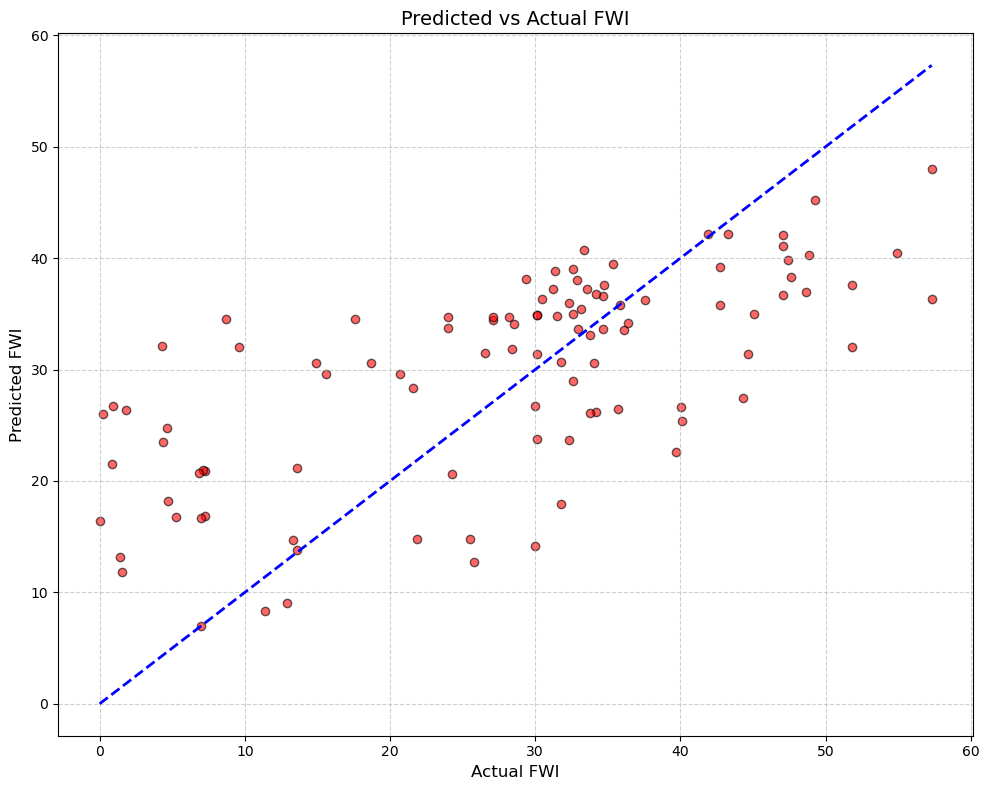

In [81]:


features = ['temp', 'RH', 'wind', 'rain', 'day', 'area','Y', 'X']  #features are selected (input)
target = 'FWI' #target varaible 

X = df[features] #input features
y = df[target]  #target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0) #the dataset is split into 80% testing and 20% training 

# the objective function for the optuna hyperparameter optimisation is defined 
def xgb_objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.3),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 5),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 5),
        "random_state": 42
    }
    
    model = xgb.XGBRegressor(**params) #model is trainned 
    model.fit(X_train, y_train)
    preds = model.predict(X_test) #model trained is used to predict the FWI using the test dataset 
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study_xgb = optuna.create_study(direction='minimize') #hyperparameters are optimised
study_xgb.optimize(xgb_objective, n_trials=30)
best_xgb_params = study_xgb.best_params
best_xgb_params['random_state'] = 42

xgb_model = xgb.XGBRegressor(**best_xgb_params) #model is trained on the best hyperparemters
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test) #trained model on best hyperparameters are used to predict the FWI

print("XGBoost R²:", r2_score(y_test, xgb_preds))

plt.figure(figsize=(10, 8))
plt.scatter(y_test, xgb_preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14) #the predited vs Actual plot is plotted 
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

#reference: https://medium.com/@fraidoonomarzai99/xgboost-regression-in-depth-cb2b3f623281

Light GBM

[I 2025-11-09 15:09:12,623] A new study created in memory with name: no-name-62dd6fc9-48f3-4f52-a152-0d69b7d5eeca


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000062 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:12,781] Trial 0 finished with value: 11.3929172340003 and parameters: {'n_estimators': 864, 'num_leaves': 181, 'max_depth': 4, 'learning_rate': 0.05973014708321952, 'subsample': 0.6394416968057811, 'colsample_bytree': 0.8915963654521935, 'reg_alpha': 2.899243497407746, 'reg_lambda': 2.1727424012244634}. Best is trial 0 with value: 11.3929172340003.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:12,933] Trial 1 finished with value: 11.559697508617193 and parameters: {'n_estimators': 733, 'num_leaves': 93, 'max_depth': 9, 'learning_rate': 0.08470102049770645, 'subsample': 0.9696794110430919, 'colsample_bytree': 0.9491424233849612, 'reg_alpha': 1.0041060738288243, 'reg_lambda': 0.2980297041593505}. Best is trial 0 with value: 11.3929172340003.
[I 2025-11-09 15:09:13,035] Trial 2 finished with value: 11.719051163502659 and parameters: {'n_estimators': 560, 'num_leaves': 171, 'max_depth': 11, 'learning_rate': 0.19862591641273913, 'subsample': 0.6496651938103786, 'colsample_bytree': 0.7456956916122285, 'reg_alpha': 2.636480737310363, 'reg_lambda': 2.6408063246469586}. Best is trial 0 with value: 11.3929172340003.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:13,210] Trial 3 finished with value: 11.732453794360422 and parameters: {'n_estimators': 988, 'num_leaves': 162, 'max_depth': 6, 'learning_rate': 0.12098607456925556, 'subsample': 0.6355732751743193, 'colsample_bytree': 0.785925251043478, 'reg_alpha': 3.488273257164827, 'reg_lambda': 1.9206667711253949}. Best is trial 0 with value: 11.3929172340003.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:13,296] Trial 4 finished with value: 11.36040543893338 and parameters: {'n_estimators': 371, 'num_leaves': 139, 'max_depth': 14, 'learning_rate': 0.12936457065815007, 'subsample': 0.7558883684849859, 'colsample_bytree': 0.9372105582675463, 'reg_alpha': 3.507568533847083, 'reg_lambda': 0.8087113564081344}. Best is trial 4 with value: 11.36040543893338.
[I 2025-11-09 15:09:13,378] Trial 5 finished with value: 11.685044217134356 and parameters: {'n_estimators': 458, 'num_leaves': 52, 'max_depth': 15, 'learning_rate': 0.2657286704855204, 'subsample': 0.625974739496032, 'colsample_bytree': 0.6591872790244474, 'reg_alpha': 2.8684703330197876, 'reg_lambda': 4.132074170281166}. Best is trial 4 with value: 11.36040543893338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000063 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:13,511] Trial 6 finished with value: 11.567306151299164 and parameters: {'n_estimators': 779, 'num_leaves': 43, 'max_depth': 7, 'learning_rate': 0.12081670312891729, 'subsample': 0.8712274948163653, 'colsample_bytree': 0.6320397094877981, 'reg_alpha': 3.1880533709173386, 'reg_lambda': 0.8320350445170771}. Best is trial 4 with value: 11.36040543893338.
[I 2025-11-09 15:09:13,624] Trial 7 finished with value: 12.252338336331695 and parameters: {'n_estimators': 820, 'num_leaves': 52, 'max_depth': 5, 'learning_rate': 0.26934064794419127, 'subsample': 0.7700566542325946, 'colsample_bytree': 0.7827622255147717, 'reg_alpha': 1.2088154281907344, 'reg_lambda': 2.8896200150227647}. Best is trial 4 with value: 11.36040543893338.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:13,734] Trial 8 finished with value: 11.846758353479323 and parameters: {'n_estimators': 822, 'num_leaves': 65, 'max_depth': 10, 'learning_rate': 0.1991638238739405, 'subsample': 0.8315209688077749, 'colsample_bytree': 0.6410745707910165, 'reg_alpha': 4.94902144045236, 'reg_lambda': 4.990395122615615}. Best is trial 4 with value: 11.36040543893338.
[I 2025-11-09 15:09:13,780] Trial 9 finished with value: 11.93341288402897 and parameters: {'n_estimators': 181, 'num_leaves': 130, 'max_depth': 7, 'learning_rate': 0.23721807845252937, 'subsample': 0.9148996891049763, 'colsample_bytree': 0.8342445301195616, 'reg_alpha': 2.351711600418986, 'reg_lambda': 1.7204500586307065}. Best is trial 4 with value: 11.36040543893338.
[I 2025-11-09 15:09:13,818] Trial 10 finished with value: 11.662460046872498 and parameters: {'n_estimators': 121, 'num_leaves': 128, 'max_depth': 15, 'learning_rate': 0.01997988868329273, 'subsample': 0.737945167600168, 'colsample_bytree': 0.9984718925411

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:13,874] Trial 11 finished with value: 11.213906573729146 and parameters: {'n_estimators': 367, 'num_leaves': 195, 'max_depth': 3, 'learning_rate': 0.04095201059340836, 'subsample': 0.7137903254522727, 'colsample_bytree': 0.8863496928414554, 'reg_alpha': 4.152607862365601, 'reg_lambda': 3.281003804133716}. Best is trial 11 with value: 11.213906573729146.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:13,967] Trial 12 finished with value: 11.24382319759184 and parameters: {'n_estimators': 338, 'num_leaves': 193, 'max_depth': 12, 'learning_rate': 0.020340960865089675, 'subsample': 0.7104602116272895, 'colsample_bytree': 0.871978062035236, 'reg_alpha': 4.136110158812541, 'reg_lambda': 3.5333237189414395}. Best is trial 11 with value: 11.213906573729146.
[I 2025-11-09 15:09:14,043] Trial 13 finished with value: 11.319700600573974 and parameters: {'n_estimators': 305, 'num_leaves': 198, 'max_depth': 12, 'learning_rate': 0.015250549881344822, 'subsample': 0.7081973015923171, 'colsample_bytree': 0.860867556073596, 'reg_alpha': 4.0811905095317025, 'reg_lambda': 3.6057721236053064}. Best is trial 11 with value: 11.213906573729146.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:14,133] Trial 14 finished with value: 11.051111112528961 and parameters: {'n_estimators': 581, 'num_leaves': 200, 'max_depth': 3, 'learning_rate': 0.05557401675785342, 'subsample': 0.7077160195747064, 'colsample_bytree': 0.9084471645640263, 'reg_alpha': 0.06544132211108256, 'reg_lambda': 3.368220534633414}. Best is trial 14 with value: 11.051111112528961.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:14,232] Trial 15 finished with value: 11.112871784865483 and parameters: {'n_estimators': 621, 'num_leaves': 163, 'max_depth': 3, 'learning_rate': 0.07207693530671372, 'subsample': 0.6877338548739067, 'colsample_bytree': 0.9348946426952868, 'reg_alpha': 0.03189331750972816, 'reg_lambda': 3.2725142822833715}. Best is trial 14 with value: 11.051111112528961.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:14,319] Trial 16 finished with value: 11.064661221177202 and parameters: {'n_estimators': 615, 'num_leaves': 154, 'max_depth': 3, 'learning_rate': 0.07799698466023942, 'subsample': 0.8034002900264756, 'colsample_bytree': 0.9999556875955068, 'reg_alpha': 0.07168285960101932, 'reg_lambda': 4.201069104577462}. Best is trial 14 with value: 11.051111112528961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:14,435] Trial 17 finished with value: 11.132267644012444 and parameters: {'n_estimators': 655, 'num_leaves': 149, 'max_depth': 5, 'learning_rate': 0.0815597994159751, 'subsample': 0.8180785964878864, 'colsample_bytree': 0.9878432202521684, 'reg_alpha': 0.08232158264873708, 'reg_lambda': 4.438184712190858}. Best is trial 14 with value: 11.051111112528961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:14,545] Trial 18 finished with value: 11.688839251644112 and parameters: {'n_estimators': 487, 'num_leaves': 108, 'max_depth': 8, 'learning_rate': 0.1663039081862117, 'subsample': 0.8659557852482566, 'colsample_bytree': 0.7171272609602125, 'reg_alpha': 0.8545802099047872, 'reg_lambda': 4.17082788968332}. Best is trial 14 with value: 11.051111112528961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:14,642] Trial 19 finished with value: 11.169429555633174 and parameters: {'n_estimators': 690, 'num_leaves': 86, 'max_depth': 3, 'learning_rate': 0.10051856746147025, 'subsample': 0.792281649156677, 'colsample_bytree': 0.9626340028141614, 'reg_alpha': 1.8488602680832158, 'reg_lambda': 4.975825556824726}. Best is trial 14 with value: 11.051111112528961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:14,759] Trial 20 finished with value: 11.639612432698604 and parameters: {'n_estimators': 557, 'num_leaves': 21, 'max_depth': 5, 'learning_rate': 0.15374441287171978, 'subsample': 0.9829963685734774, 'colsample_bytree': 0.9007316771784714, 'reg_alpha': 1.6130408468218445, 'reg_lambda': 3.9331383583522093}. Best is trial 14 with value: 11.051111112528961.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:14,841] Trial 21 finished with value: 11.045476703755545 and parameters: {'n_estimators': 628, 'num_leaves': 160, 'max_depth': 3, 'learning_rate': 0.061624081097658254, 'subsample': 0.6832615585362, 'colsample_bytree': 0.9245850398395321, 'reg_alpha': 0.059646900102657927, 'reg_lambda': 3.0815537957350916}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:14,933] Trial 22 finished with value: 11.183036810463172 and parameters: {'n_estimators': 486, 'num_leaves': 153, 'max_depth': 4, 'learning_rate': 0.049229584771827, 'subsample': 0.6840194293522113, 'colsample_bytree': 0.9178910692534182, 'reg_alpha': 0.4572533419556649, 'reg_lambda': 2.874626043052922}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:15,032] Trial 23 finished with value: 11.21125365611969 and parameters: {'n_estimators': 615, 'num_leaves': 184, 'max_depth': 4, 'learning_rate': 0.09838295282656367, 'subsample': 0.7855757195100184, 'colsample_bytree': 0.8348501260538811, 'reg_alpha': 0.468767278953976, 'reg_lambda': 3.7524739652882424}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:15,175] Trial 24 finished with value: 11.387972951263697 and parameters: {'n_estimators': 739, 'num_leaves': 175, 'max_depth': 6, 'learning_rate': 0.04608645659349644, 'subsample': 0.7462154916688627, 'colsample_bytree': 0.9796834450224945, 'reg_alpha': 0.5135140022637485, 'reg_lambda': 3.1186422900461626}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:15,288] Trial 25 finished with value: 11.099632931130618 and parameters: {'n_estimators': 905, 'num_leaves': 111, 'max_depth': 3, 'learning_rate': 0.06074119909377922, 'subsample': 0.603890683786428, 'colsample_bytree': 0.9689219032347006, 'reg_alpha': 1.4305115546564986, 'reg_lambda': 4.486035769534577}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:15,391] Trial 26 finished with value: 11.653543672586087 and parameters: {'n_estimators': 455, 'num_leaves': 153, 'max_depth': 6, 'learning_rate': 0.14697267860019525, 'subsample': 0.6669186234254705, 'colsample_bytree': 0.9226035158720889, 'reg_alpha': 0.7167934124132708, 'reg_lambda': 2.3007883466375416}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:15,475] Trial 27 finished with value: 11.451225029535234 and parameters: {'n_estimators': 570, 'num_leaves': 121, 'max_depth': 4, 'learning_rate': 0.10234256246209311, 'subsample': 0.8482157432104128, 'colsample_bytree': 0.8377264781472448, 'reg_alpha': 0.14441976338747198, 'reg_lambda': 4.411313795002854}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000284 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:15,650] Trial 28 finished with value: 11.268009109652933 and parameters: {'n_estimators': 693, 'num_leaves': 167, 'max_depth': 5, 'learning_rate': 0.038356558905915626, 'subsample': 0.7263308527928415, 'colsample_bytree': 0.9983439768663759, 'reg_alpha': 2.2020758914622935, 'reg_lambda': 2.665468395878322}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:15,792] Trial 29 finished with value: 11.435145680391596 and parameters: {'n_estimators': 883, 'num_leaves': 179, 'max_depth': 4, 'learning_rate': 0.06442963670656196, 'subsample': 0.9133158185790807, 'colsample_bytree': 0.904306580223463, 'reg_alpha': 1.1351192018818455, 'reg_lambda': 2.223995012009503}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:15,951] Trial 30 finished with value: 11.951280864949348 and parameters: {'n_estimators': 411, 'num_leaves': 145, 'max_depth': 7, 'learning_rate': 0.18705969648148738, 'subsample': 0.8045955216486643, 'colsample_bytree': 0.9562044948416919, 'reg_alpha': 0.3114192266735314, 'reg_lambda': 3.434097685436191}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:16,113] Trial 31 finished with value: 11.131792365028632 and parameters: {'n_estimators': 992, 'num_leaves': 113, 'max_depth': 3, 'learning_rate': 0.05931620723355362, 'subsample': 0.6078436048560246, 'colsample_bytree': 0.9655066213378253, 'reg_alpha': 1.4778617606134754, 'reg_lambda': 4.599992276436403}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:16,227] Trial 32 finished with value: 11.25155056438322 and parameters: {'n_estimators': 917, 'num_leaves': 93, 'max_depth': 3, 'learning_rate': 0.08348008272028301, 'subsample': 0.6007780684051018, 'colsample_bytree': 0.9511817054735617, 'reg_alpha': 0.7636753883171951, 'reg_lambda': 3.9987945455071037}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:16,289] Trial 33 finished with value: 11.325638974961826 and parameters: {'n_estimators': 266, 'num_leaves': 100, 'max_depth': 4, 'learning_rate': 0.033883052559313113, 'subsample': 0.6617615821782237, 'colsample_bytree': 0.9719883971930026, 'reg_alpha': 1.929497815165188, 'reg_lambda': 4.722589534647437}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:16,412] Trial 34 finished with value: 11.153362706835106 and parameters: {'n_estimators': 744, 'num_leaves': 73, 'max_depth': 3, 'learning_rate': 0.07587751870257531, 'subsample': 0.630544135625694, 'colsample_bytree': 0.9301370843324738, 'reg_alpha': 1.1014586937728446, 'reg_lambda': 3.8481238850440826}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:16,544] Trial 35 finished with value: 11.18396910169249 and parameters: {'n_estimators': 600, 'num_leaves': 134, 'max_depth': 5, 'learning_rate': 0.11168896952848917, 'subsample': 0.68228012353299, 'colsample_bytree': 0.8649205853824364, 'reg_alpha': 1.3889576717892826, 'reg_lambda': 4.389218231644846}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:16,691] Trial 36 finished with value: 11.289556367797593 and parameters: {'n_estimators': 528, 'num_leaves': 187, 'max_depth': 9, 'learning_rate': 0.05993122775756741, 'subsample': 0.6437556575285587, 'colsample_bytree': 0.9438115697970569, 'reg_alpha': 0.7022390461624534, 'reg_lambda': 4.163630006125619}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:16,907] Trial 37 finished with value: 11.952485927625146 and parameters: {'n_estimators': 923, 'num_leaves': 159, 'max_depth': 6, 'learning_rate': 0.13485728118066104, 'subsample': 0.7690173401562538, 'colsample_bytree': 0.9121284798967689, 'reg_alpha': 0.003593013598238083, 'reg_lambda': 3.0116579735743896}. Best is trial 21 with value: 11.045476703755545.
[I 2025-11-09 15:09:16,992] Trial 38 finished with value: 11.106086016182532 and parameters: {'n_estimators': 683, 'num_leaves': 139, 'max_depth': 3, 'learning_rate': 0.09093660989800811, 'subsample': 0.6941956418175017, 'colsample_bytree': 0.7456134670045454, 'reg_alpha': 0.3683063907149879, 'reg_lambda': 1.6229126062404542}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:17,119] Trial 39 finished with value: 11.278529707866916 and parameters: {'n_estimators': 805, 'num_leaves': 169, 'max_depth': 4, 'learning_rate': 0.029277205588686954, 'subsample': 0.6209102176326621, 'colsample_bytree': 0.8076995671522224, 'reg_alpha': 0.27699863324258645, 'reg_lambda': 0.17886109519143778}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:17,266] Trial 40 finished with value: 11.272183288201987 and parameters: {'n_estimators': 511, 'num_leaves': 121, 'max_depth': 5, 'learning_rate': 0.05529058725590723, 'subsample': 0.6540747300386093, 'colsample_bytree': 0.9763657218456359, 'reg_alpha': 0.9368332038756447, 'reg_lambda': 2.7528539187007395}. Best is trial 21 with value: 11.045476703755545.
[I 2025-11-09 15:09:17,352] Trial 41 finished with value: 11.119244953492073 and parameters: {'n_estimators': 665, 'num_leaves': 141, 'max_depth': 3, 'learning_rate': 0.09022271752404665, 'subsample': 0.695984384553359, 'colsample_bytree': 0.750729422176075, 'reg_alpha': 0.3198315291535967, 'reg_lambda': 1.7909806210412285}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000074 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:17,441] Trial 42 finished with value: 11.15052618656142 and parameters: {'n_estimators': 710, 'num_leaves': 136, 'max_depth': 3, 'learning_rate': 0.11749527789421853, 'subsample': 0.7567500264125485, 'colsample_bytree': 0.6819833398670616, 'reg_alpha': 0.5642355294339995, 'reg_lambda': 1.1096872109194118}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:17,592] Trial 43 finished with value: 11.40885385711568 and parameters: {'n_estimators': 769, 'num_leaves': 116, 'max_depth': 4, 'learning_rate': 0.07007620191540942, 'subsample': 0.7298825189953562, 'colsample_bytree': 0.7627642322365189, 'reg_alpha': 0.30080442872129787, 'reg_lambda': 2.3967586001573116}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:17,692] Trial 44 finished with value: 12.10707144916999 and parameters: {'n_estimators': 646, 'num_leaves': 127, 'max_depth': 4, 'learning_rate': 0.29286364872353043, 'subsample': 0.6716227515587626, 'colsample_bytree': 0.7151669672590554, 'reg_alpha': 1.2786164995675542, 'reg_lambda': 1.4968452073335665}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:17,802] Trial 45 finished with value: 11.370374786654276 and parameters: {'n_estimators': 859, 'num_leaves': 104, 'max_depth': 3, 'learning_rate': 0.1314069342326216, 'subsample': 0.7714832053435501, 'colsample_bytree': 0.7224447525143443, 'reg_alpha': 2.8692548269537452, 'reg_lambda': 3.629462733518053}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000228 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:18,021] Trial 46 finished with value: 11.259299689438667 and parameters: {'n_estimators': 581, 'num_leaves': 157, 'max_depth': 6, 'learning_rate': 0.027648677574403327, 'subsample': 0.6374246281157252, 'colsample_bytree': 0.8079745737449007, 'reg_alpha': 0.9939182656494185, 'reg_lambda': 2.0104977482690103}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:18,141] Trial 47 finished with value: 11.443142728475923 and parameters: {'n_estimators': 438, 'num_leaves': 142, 'max_depth': 13, 'learning_rate': 0.0947206906701566, 'subsample': 0.7066548880322193, 'colsample_bytree': 0.8828837269448795, 'reg_alpha': 0.6209209388725604, 'reg_lambda': 0.514928805685199}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:18,310] Trial 48 finished with value: 11.394618169939951 and parameters: {'n_estimators': 634, 'num_leaves': 189, 'max_depth': 8, 'learning_rate': 0.08015531977698334, 'subsample': 0.904562354640551, 'colsample_bytree': 0.9436859873499035, 'reg_alpha': 2.5339861243143504, 'reg_lambda': 3.3356640540525504}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:18,392] Trial 49 finished with value: 11.410066214843908 and parameters: {'n_estimators': 530, 'num_leaves': 172, 'max_depth': 3, 'learning_rate': 0.012257131946042665, 'subsample': 0.9539092242943389, 'colsample_bytree': 0.6133340554490196, 'reg_alpha': 3.15392658059182, 'reg_lambda': 2.4791769020957535}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:18,611] Trial 50 finished with value: 11.538715506863564 and parameters: {'n_estimators': 762, 'num_leaves': 78, 'max_depth': 11, 'learning_rate': 0.06955844585237604, 'subsample': 0.8186640748882715, 'colsample_bytree': 0.7819729598686297, 'reg_alpha': 0.007526464770347435, 'reg_lambda': 1.4592089300447815}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [I

[I 2025-11-09 15:09:18,696] Trial 51 finished with value: 11.097426278492184 and parameters: {'n_estimators': 615, 'num_leaves': 165, 'max_depth': 3, 'learning_rate': 0.049471212648436756, 'subsample': 0.7213924084204648, 'colsample_bytree': 0.927548456632936, 'reg_alpha': 0.17170755016898195, 'reg_lambda': 4.779352834402198}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:18,850] Trial 52 finished with value: 11.063801557457694 and parameters: {'n_estimators': 712, 'num_leaves': 200, 'max_depth': 4, 'learning_rate': 0.04556867160867425, 'subsample': 0.7256988489364768, 'colsample_bytree': 0.9915037500969665, 'reg_alpha': 0.2316466883293149, 'reg_lambda': 4.750891636460317}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:18,947] Trial 53 finished with value: 11.051532273518468 and parameters: {'n_estimators': 596, 'num_leaves': 199, 'max_depth': 4, 'learning_rate': 0.04894381271977342, 'subsample': 0.7505342495186934, 'colsample_bytree': 0.9943811811267245, 'reg_alpha': 0.17207822254287647, 'reg_lambda': 4.800577102154723}. Best is trial 21 with value: 11.045476703755545.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:19,102] Trial 54 finished with value: 11.028649784249213 and parameters: {'n_estimators': 601, 'num_leaves': 181, 'max_depth': 5, 'learning_rate': 0.0426332003256465, 'subsample': 0.723017122440766, 'colsample_bytree': 0.9961965334367854, 'reg_alpha': 0.18616809375760673, 'reg_lambda': 4.767192508429632}. Best is trial 54 with value: 11.028649784249213.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:19,259] Trial 55 finished with value: 11.418169307513326 and parameters: {'n_estimators': 718, 'num_leaves': 195, 'max_depth': 5, 'learning_rate': 0.04300339689375064, 'subsample': 0.74526224948131, 'colsample_bytree': 0.9999671012166755, 'reg_alpha': 0.21071726535818305, 'reg_lambda': 4.969806683057592}. Best is trial 54 with value: 11.028649784249213.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:19,354] Trial 56 finished with value: 11.208606423296382 and parameters: {'n_estimators': 579, 'num_leaves': 200, 'max_depth': 4, 'learning_rate': 0.023947139986248818, 'subsample': 0.7613308706612474, 'colsample_bytree': 0.9844753993445232, 'reg_alpha': 0.542123826383498, 'reg_lambda': 4.2279440665643575}. Best is trial 54 with value: 11.028649784249213.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:19,503] Trial 57 finished with value: 11.775084285965418 and parameters: {'n_estimators': 543, 'num_leaves': 177, 'max_depth': 5, 'learning_rate': 0.23418652689321062, 'subsample': 0.7841967192693109, 'colsample_bytree': 0.990670888823397, 'reg_alpha': 0.1570152433776315, 'reg_lambda': 4.758852288624812}. Best is trial 54 with value: 11.028649784249213.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:19,600] Trial 58 finished with value: 11.208280559671651 and parameters: {'n_estimators': 495, 'num_leaves': 190, 'max_depth': 4, 'learning_rate': 0.04039407058994762, 'subsample': 0.7363727665631937, 'colsample_bytree': 0.9591927796186319, 'reg_alpha': 0.8815902835516568, 'reg_lambda': 4.62936577013442}. Best is trial 54 with value: 11.028649784249213.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:19,784] Trial 59 finished with value: 11.269984110957102 and parameters: {'n_estimators': 666, 'num_leaves': 200, 'max_depth': 6, 'learning_rate': 0.011240566444648326, 'subsample': 0.7068902866104175, 'colsample_bytree': 0.9805350773983693, 'reg_alpha': 0.44439586291788874, 'reg_lambda': 4.875413699514492}. Best is trial 54 with value: 11.028649784249213.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:19,963] Trial 60 finished with value: 11.202766271705636 and parameters: {'n_estimators': 594, 'num_leaves': 183, 'max_depth': 4, 'learning_rate': 0.05466391927786358, 'subsample': 0.8063999928858003, 'colsample_bytree': 0.8953033099951765, 'reg_alpha': 0.6579121805439306, 'reg_lambda': 4.243595750533984}. Best is trial 54 with value: 11.028649784249213.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000054 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:20,099] Trial 61 finished with value: 11.003707626832345 and parameters: {'n_estimators': 626, 'num_leaves': 166, 'max_depth': 3, 'learning_rate': 0.048395242770890384, 'subsample': 0.7213471825421365, 'colsample_bytree': 0.9371777847786341, 'reg_alpha': 0.012906983763390549, 'reg_lambda': 4.76034365321925}. Best is trial 61 with value: 11.003707626832345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:20,284] Trial 62 finished with value: 11.128846504016499 and parameters: {'n_estimators': 635, 'num_leaves': 182, 'max_depth': 5, 'learning_rate': 0.04888878098517825, 'subsample': 0.7173235461619971, 'colsample_bytree': 0.9375627704081394, 'reg_alpha': 0.04859229843120447, 'reg_lambda': 4.446418261215708}. Best is trial 61 with value: 11.003707626832345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:20,378] Trial 63 finished with value: 11.134122829280713 and parameters: {'n_estimators': 552, 'num_leaves': 195, 'max_depth': 4, 'learning_rate': 0.03663429001334094, 'subsample': 0.7434287775157619, 'colsample_bytree': 0.95426846511219, 'reg_alpha': 0.40996403619334965, 'reg_lambda': 4.600292328132714}. Best is trial 61 with value: 11.003707626832345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:20,519] Trial 64 finished with value: 11.193116474651298 and parameters: {'n_estimators': 707, 'num_leaves': 174, 'max_depth': 3, 'learning_rate': 0.02142801808293198, 'subsample': 0.679700733298435, 'colsample_bytree': 0.9903549327683592, 'reg_alpha': 0.2630860813313993, 'reg_lambda': 4.07774646444151}. Best is trial 61 with value: 11.003707626832345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:20,693] Trial 65 finished with value: 11.498489930518227 and parameters: {'n_estimators': 667, 'num_leaves': 190, 'max_depth': 5, 'learning_rate': 0.06542123665041064, 'subsample': 0.842994663957018, 'colsample_bytree': 0.8485862013497392, 'reg_alpha': 3.695078770696782, 'reg_lambda': 3.7302848272062246}. Best is trial 61 with value: 11.003707626832345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:20,788] Trial 66 finished with value: 11.180501276107298 and parameters: {'n_estimators': 609, 'num_leaves': 182, 'max_depth': 3, 'learning_rate': 0.10791038319731001, 'subsample': 0.7529852848581806, 'colsample_bytree': 0.9715560008717571, 'reg_alpha': 4.853280209046905, 'reg_lambda': 4.870288780191538}. Best is trial 61 with value: 11.003707626832345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:20,982] Trial 67 finished with value: 11.654847124655761 and parameters: {'n_estimators': 569, 'num_leaves': 150, 'max_depth': 10, 'learning_rate': 0.07531071142924156, 'subsample': 0.7796044111200872, 'colsample_bytree': 0.9137588636435064, 'reg_alpha': 0.058328396256962955, 'reg_lambda': 4.5620597543313135}. Best is trial 61 with value: 11.003707626832345.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000071 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:21,204] Trial 68 finished with value: 11.32885654321234 and parameters: {'n_estimators': 475, 'num_leaves': 161, 'max_depth': 8, 'learning_rate': 0.033459752120631736, 'subsample': 0.6957791946942684, 'colsample_bytree': 0.8769397976718067, 'reg_alpha': 0.8164944883455441, 'reg_lambda': 4.337981017166357}. Best is trial 61 with value: 11.003707626832345.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:21,331] Trial 69 finished with value: 10.953716916964774 and parameters: {'n_estimators': 641, 'num_leaves': 194, 'max_depth': 4, 'learning_rate': 0.052506454188713685, 'subsample': 0.7335961394587237, 'colsample_bytree': 0.9985659784389617, 'reg_alpha': 0.1708372582370331, 'reg_lambda': 3.929245172008943}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:21,522] Trial 70 finished with value: 11.219356196349153 and parameters: {'n_estimators': 642, 'num_leaves': 193, 'max_depth': 7, 'learning_rate': 0.05351029802241577, 'subsample': 0.7303098169239437, 'colsample_bytree': 0.9633543208684564, 'reg_alpha': 0.47180753411881743, 'reg_lambda': 3.873786608571818}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:21,644] Trial 71 finished with value: 11.047519221417314 and parameters: {'n_estimators': 739, 'num_leaves': 178, 'max_depth': 4, 'learning_rate': 0.06334810203605759, 'subsample': 0.7143658633969373, 'colsample_bytree': 0.999614316077766, 'reg_alpha': 0.2093404959893205, 'reg_lambda': 3.1459389381379914}. Best is trial 69 with value: 10.953716916964774.
[I 2025-11-09 15:09:21,818] Trial 72 finished with value: 11.05594705389501 and parameters: {'n_estimators': 794, 'num_leaves': 177, 'max_depth': 4, 'learning_rate': 0.04427168045683951, 'subsample': 0.7110053688932241, 'colsample_bytree': 0.981849706762988, 'reg_alpha': 0.20446060533567337, 'reg_lambda': 3.1529065715555182}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:21,957] Trial 73 finished with value: 11.029436802488009 and parameters: {'n_estimators': 739, 'num_leaves': 177, 'max_depth': 4, 'learning_rate': 0.06406789330190704, 'subsample': 0.7062619458150352, 'colsample_bytree': 0.9783976344925093, 'reg_alpha': 0.1563868629842053, 'reg_lambda': 3.167410250409592}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:22,092] Trial 74 finished with value: 11.198342276170084 and parameters: {'n_estimators': 732, 'num_leaves': 169, 'max_depth': 4, 'learning_rate': 0.06436269399011889, 'subsample': 0.6745441606302537, 'colsample_bytree': 0.9450421401750339, 'reg_alpha': 0.3830707180266708, 'reg_lambda': 3.5026167785996343}. Best is trial 69 with value: 10.953716916964774.
[I 2025-11-09 15:09:22,250] Trial 75 finished with value: 11.03092444773004 and parameters: {'n_estimators': 847, 'num_leaves': 186, 'max_depth': 3, 'learning_rate': 0.03012947758575512, 'subsample': 0.7024645136423893, 'colsample_bytree': 0.9729184808283677, 'reg_alpha': 0.6299650295000747, 'reg_lambda': 2.8671172661233957}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:22,357] Trial 76 finished with value: 11.19020186986583 and parameters: {'n_estimators': 845, 'num_leaves': 185, 'max_depth': 3, 'learning_rate': 0.018492366348961904, 'subsample': 0.6585528612481409, 'colsample_bytree': 0.9696779610691333, 'reg_alpha': 0.5311138844427079, 'reg_lambda': 2.991247373975994}. Best is trial 69 with value: 10.953716916964774.
[I 2025-11-09 15:09:22,488] Trial 77 finished with value: 11.169351740711711 and parameters: {'n_estimators': 688, 'num_leaves': 172, 'max_depth': 3, 'learning_rate': 0.08793992330549259, 'subsample': 0.6996061501485905, 'colsample_bytree': 0.9540803704591064, 'reg_alpha': 0.7258499737656992, 'reg_lambda': 2.7934593540702024}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:22,641] Trial 78 finished with value: 11.149426659851775 and parameters: {'n_estimators': 753, 'num_leaves': 180, 'max_depth': 5, 'learning_rate': 0.06078709875830217, 'subsample': 0.6850015537360833, 'colsample_bytree': 0.9772172205270291, 'reg_alpha': 0.3678171808851428, 'reg_lambda': 3.205311883369307}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:22,848] Trial 79 finished with value: 11.11915725885445 and parameters: {'n_estimators': 826, 'num_leaves': 165, 'max_depth': 6, 'learning_rate': 0.030971860663112562, 'subsample': 0.7152814496770927, 'colsample_bytree': 0.9252153678931396, 'reg_alpha': 0.007893975339025083, 'reg_lambda': 2.5825544840015224}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:23,007] Trial 80 finished with value: 11.184939507314063 and parameters: {'n_estimators': 940, 'num_leaves': 188, 'max_depth': 3, 'learning_rate': 0.07186121996649833, 'subsample': 0.7342678152872211, 'colsample_bytree': 0.9059768455667071, 'reg_alpha': 0.6514536045715181, 'reg_lambda': 3.335848507403284}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:23,243] Trial 81 finished with value: 11.120908731244072 and parameters: {'n_estimators': 786, 'num_leaves': 193, 'max_depth': 4, 'learning_rate': 0.052177826199595066, 'subsample': 0.7015434958857831, 'colsample_bytree': 0.9961277508663835, 'reg_alpha': 0.14155935498838124, 'reg_lambda': 3.0120236700744103}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:23,349] Trial 82 finished with value: 11.117367200464974 and parameters: {'n_estimators': 597, 'num_leaves': 186, 'max_depth': 4, 'learning_rate': 0.036293606565168064, 'subsample': 0.7179170778816377, 'colsample_bytree': 0.9352716144330822, 'reg_alpha': 0.14779949308264753, 'reg_lambda': 2.8947709565046766}. Best is trial 69 with value: 10.953716916964774.
[I 2025-11-09 15:09:23,500] Trial 83 finished with value: 11.943974082417151 and parameters: {'n_estimators': 886, 'num_leaves': 178, 'max_depth': 3, 'learning_rate': 0.17131919018270156, 'subsample': 0.6882429403552035, 'colsample_bytree': 0.9607837770451675, 'reg_alpha': 0.3259701331004399, 'reg_lambda': 3.423258003565462}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000076 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:23,676] Trial 84 finished with value: 11.288154518614494 and parameters: {'n_estimators': 950, 'num_leaves': 196, 'max_depth': 5, 'learning_rate': 0.026486101185299253, 'subsample': 0.6690056820869725, 'colsample_bytree': 0.9853320009595321, 'reg_alpha': 0.5270808714865213, 'reg_lambda': 2.7009723405358006}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:23,810] Trial 85 finished with value: 11.058429860841187 and parameters: {'n_estimators': 514, 'num_leaves': 191, 'max_depth': 4, 'learning_rate': 0.08113944418679654, 'subsample': 0.7519461538940085, 'colsample_bytree': 0.9690252550521132, 'reg_alpha': 0.12548067451428038, 'reg_lambda': 3.09453193184921}. Best is trial 69 with value: 10.953716916964774.
[I 2025-11-09 15:09:23,912] Trial 86 finished with value: 11.0546327609082 and parameters: {'n_estimators': 625, 'num_leaves': 173, 'max_depth': 3, 'learning_rate': 0.06333552439229256, 'subsample': 0.7395389655642663, 'colsample_bytree': 0.9994180625393333, 'reg_alpha': 0.24557744093059306, 'reg_lambda': 3.5625606114495807}. Best is trial 69 with value: 10.953716916964774.
[I 2025-11-09 15:09:24,017] Trial 87 finished with value: 11.198812771849584 and parameters: {'n_estimators': 660, 'num_leaves': 186, 'max_depth': 4, 'learning_rate': 0.05589862631853922, 'subsample': 0.7248932113676795, 'colsample_bytree': 0.949

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:24,149] Trial 88 finished with value: 11.385187582506568 and parameters: {'n_estimators': 570, 'num_leaves': 168, 'max_depth': 3, 'learning_rate': 0.21278827929988148, 'subsample': 0.7665623144729911, 'colsample_bytree': 0.9749547478353747, 'reg_alpha': 0.40218700122772555, 'reg_lambda': 3.7231118862587}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:24,257] Trial 89 finished with value: 11.357744879003437 and parameters: {'n_estimators': 541, 'num_leaves': 157, 'max_depth': 5, 'learning_rate': 0.04193864653465906, 'subsample': 0.6478435848973739, 'colsample_bytree': 0.986547618672352, 'reg_alpha': 0.8160876909742975, 'reg_lambda': 3.2597981381103853}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:24,452] Trial 90 finished with value: 11.450517340260037 and parameters: {'n_estimators': 679, 'num_leaves': 24, 'max_depth': 14, 'learning_rate': 0.07111694074915678, 'subsample': 0.6914663496288107, 'colsample_bytree': 0.938684334124176, 'reg_alpha': 0.005942090573085937, 'reg_lambda': 4.052484618045877}. Best is trial 69 with value: 10.953716916964774.
[I 2025-11-09 15:09:24,597] Trial 91 finished with value: 11.092685697858004 and parameters: {'n_estimators': 629, 'num_leaves': 174, 'max_depth': 3, 'learning_rate': 0.06431956136795298, 'subsample': 0.741558031949472, 'colsample_bytree': 0.9979944001209041, 'reg_alpha': 0.2535553662927929, 'reg_lambda': 3.5902599570859315}. Best is trial 69 with value: 10.953716916964774.
[I 2025-11-09 15:09:24,685] Trial 92 finished with value: 11.085345488297294 and parameters: {'n_estimators': 592, 'num_leaves': 163, 'max_depth': 3, 'learning_rate': 0.057837094615240225, 'subsample': 0.7058590886910866, 'colsample_bytree': 0.9

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000077 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:24,826] Trial 93 finished with value: 11.063846382535782 and parameters: {'n_estimators': 729, 'num_leaves': 179, 'max_depth': 3, 'learning_rate': 0.04848693037035107, 'subsample': 0.7338639558474567, 'colsample_bytree': 0.9764337938758406, 'reg_alpha': 0.13439664910283355, 'reg_lambda': 3.352758396055602}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000053 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:24,933] Trial 94 finished with value: 11.030422051879036 and parameters: {'n_estimators': 620, 'num_leaves': 196, 'max_depth': 4, 'learning_rate': 0.03686818030101281, 'subsample': 0.7212161415863045, 'colsample_bytree': 0.9995078120409913, 'reg_alpha': 0.6010064713744708, 'reg_lambda': 2.9544081690342763}. Best is trial 69 with value: 10.953716916964774.
[I 2025-11-09 15:09:25,087] Trial 95 finished with value: 11.108291742263004 and parameters: {'n_estimators': 650, 'num_leaves': 197, 'max_depth': 4, 'learning_rate': 0.033699678280582436, 'subsample': 0.7190937812978776, 'colsample_bytree': 0.9630866144473159, 'reg_alpha': 0.5882478389347208, 'reg_lambda': 2.579465606694754}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 265
[LightGBM] [Info] Number of data points in the train set: 410, number of used features: 7
[LightGBM] [Info] Start training from score 31.382977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[I 2025-11-09 15:09:25,210] Trial 96 finished with value: 11.185601952935237 and parameters: {'n_estimators': 696, 'num_leaves': 191, 'max_depth': 4, 'learning_rate': 0.04035893956609764, 'subsample': 0.7033292000794613, 'colsample_bytree': 0.9835095692302824, 'reg_alpha': 2.071193396618818, 'reg_lambda': 3.0620200879548602}. Best is trial 69 with value: 10.953716916964774.
[I 2025-11-09 15:09:25,351] Trial 97 finished with value: 11.193365370357766 and parameters: {'n_estimators': 615, 'num_leaves': 183, 'max_depth': 4, 'learning_rate': 0.0170714717844853, 'subsample': 0.6785587590604236, 'colsample_bytree': 0.9489326359755081, 'reg_alpha': 0.4050091047207488, 'reg_lambda': 2.3781310887312026}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:25,499] Trial 98 finished with value: 11.216179795284642 and parameters: {'n_estimators': 826, 'num_leaves': 200, 'max_depth': 4, 'learning_rate': 0.025793514294258343, 'subsample': 0.750666895725455, 'colsample_bytree': 0.9210978653893724, 'reg_alpha': 1.238269060942496, 'reg_lambda': 3.2071215345249873}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-11-09 15:09:25,677] Trial 99 finished with value: 11.173999397220813 and parameters: {'n_estimators': 561, 'num_leaves': 196, 'max_depth': 5, 'learning_rate': 0.04741425881478728, 'subsample': 0.7116921159924966, 'colsample_bytree': 0.9675689036532052, 'reg_alpha': 0.621644633387614, 'reg_lambda': 2.9244739994369398}. Best is trial 69 with value: 10.953716916964774.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

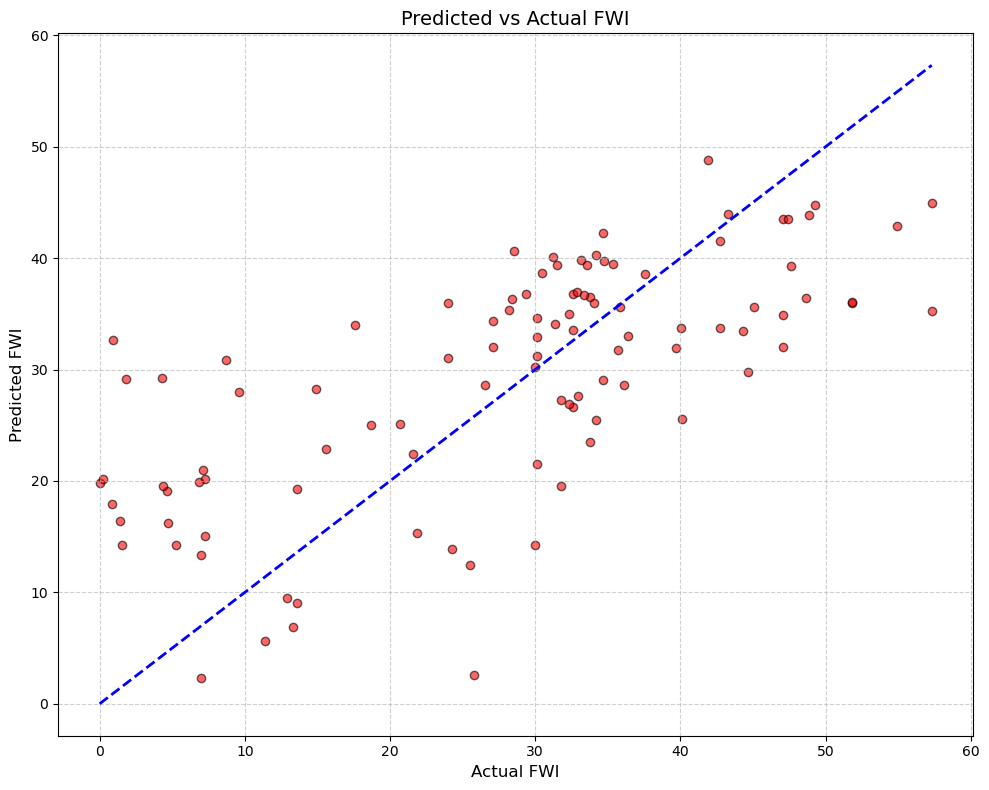

In [82]:

def lgb_objective(trial): #objective function is defined for hyperparameter tuning 
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "num_leaves": trial.suggest_int("num_leaves", 20, 200),
        "max_depth": trial.suggest_int("max_depth", 3, 15),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=False),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 5.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.0, 5.0),
        "random_state": 42
    }
    
    model = lgb.LGBMRegressor(**params)  #initially the model is trained for the above sample hyperparameters
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study_lgb = optuna.create_study(direction='minimize') # the hyperparameter optimisation is run for 100 trials
study_lgb.optimize(lgb_objective, n_trials=100)
best_lgb_params = study_lgb.best_params
best_lgb_params['random_state'] = 42

lgb_model = lgb.LGBMRegressor(**best_lgb_params) #the best hyperparameters and the used to train the final Light GBM model
lgb_model.fit(X_train, y_train)
lgb_preds = lgb_model.predict(X_test)

print("LightGBM R²:", r2_score(y_test, lgb_preds))

plt.figure(figsize=(10, 8))
plt.scatter(y_test, lgb_preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14) #predicted Vs Actual plot
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

#reference: https://forecastegy.com/posts/how-to-use-optuna-to-tune-lightgbm-hyperparameters/


Random Forest Regressor

[I 2025-11-09 15:09:25,998] A new study created in memory with name: no-name-4cfdd9a4-02e1-45c1-be9d-53ffabb2bffa
[I 2025-11-09 15:09:26,537] Trial 0 finished with value: 11.824532093001995 and parameters: {'n_estimators': 479, 'max_depth': 11, 'min_samples_split': 5, 'min_samples_leaf': 1}. Best is trial 0 with value: 11.824532093001995.
[I 2025-11-09 15:09:27,503] Trial 1 finished with value: 11.598590364120374 and parameters: {'n_estimators': 941, 'max_depth': 12, 'min_samples_split': 7, 'min_samples_leaf': 4}. Best is trial 1 with value: 11.598590364120374.
[I 2025-11-09 15:09:28,197] Trial 2 finished with value: 11.703420392911827 and parameters: {'n_estimators': 673, 'max_depth': 6, 'min_samples_split': 11, 'min_samples_leaf': 5}. Best is trial 1 with value: 11.598590364120374.
[I 2025-11-09 15:09:28,452] Trial 3 finished with value: 11.62696220935804 and parameters: {'n_estimators': 220, 'max_depth': 12, 'min_samples_split': 8, 'min_samples_leaf': 6}. Best is trial 1 with value:

Random Forest R²: 0.406020033037473


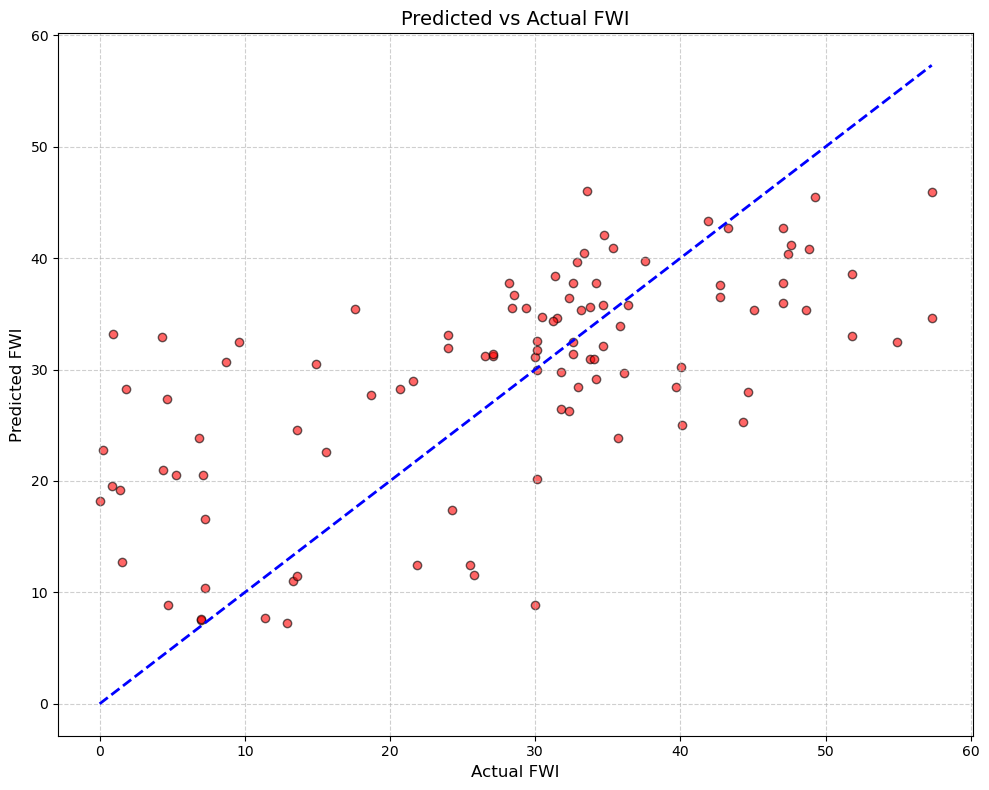

In [83]:

def rf_objective(trial): #objective function for Optuna
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000), #total number of trees in the forest
        "max_depth": trial.suggest_int("max_depth", 3, 15), #maximum depth of each decision tree
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20), 
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 10),
        "random_state": 42,
        "n_jobs": -1 #uses all CPU cores for faster computaiton
    }
    
    model = RandomForestRegressor(**params)   #random forest model is trained 
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    return rmse

study_rf = optuna.create_study(direction='minimize')  #Optuna hyperparameter optimisation is conducted 
study_rf.optimize(rf_objective, n_trials=100)
best_rf_params = study_rf.best_params
best_rf_params['random_state'] = 42
best_rf_params['n_jobs'] = -1

rf_model = RandomForestRegressor(**best_rf_params)  #using best parameters the model is then trained 
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_test)

print("Random Forest R²:", r2_score(y_test, rf_preds))


plt.figure(figsize=(10, 8))
plt.scatter(y_test, rf_preds, color='red', alpha=0.6, edgecolor='black')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'b--', linewidth=2) 
plt.xlabel("Actual FWI", fontsize=12)
plt.ylabel("Predicted FWI", fontsize=12)
plt.title("Predicted vs Actual FWI", fontsize=14) #predicted vs actual plot is plotted 
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

#reference: https://medium.com/@ehsannabatchian/optimizing-random-forest-models-a-deep-dive-into-hyperparameter-tuning-with-optuna-b8e4fe7f3670